<a href="https://colab.research.google.com/github/BenShermaister1/Graph_Algo_Final_Project_2024/blob/main/Graph_Algo_Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **טעינת הנתונים ובדיקה ראשונית**

> בשלב הראשון טענתי את הנתונים וביצעתי בדיקה ראשונית כדי לוודא שהנתונים נטענו בצורה נכונה ושיש לי הבנה בסיסית של המידע שאיתו נעבוד.




In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [20]:
import subprocess
import sys

def install(package):
    subprocess.check_call([sys.executable, "-m", "pip", "install", package])

# List of packages to check/install
required_packages = {
    "pandas": "pandas",
    "seaborn": "seaborn",
    "matplotlib": "matplotlib",
    "networkx": "networkx",
    "scipy": "scipy",
    "community-louvain": "python-louvain",
    "geopandas": "geopandas",
    "mpl_toolkits.axes_grid1": "matplotlib"
}

# Attempt to import each package, install if not found
for package_name, pip_name in required_packages.items():
    try:
        __import__(package_name)
    except ImportError:
        install(pip_name)


In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
from scipy.spatial import KDTree
import community.community_louvain as community_louvain
import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable


#file_path = '/database-earthquake 1965-2016.csv'
file_path = '/content/drive/MyDrive/database-earthquake 1965-2016.csv'
earthquake_data = pd.read_csv(file_path)

# הצגת חמש השורות הראשונות של הנתונים
print("Displaying the first 5 rows of the dataset:")
print(earthquake_data.head())

# קבלת מידע כללי על מערך הנתונים
print("\nDataset Information:")
print(earthquake_data.info())

# סטטיסטיקות תיאוריות עבור עמודות מספריות
print("\nDescriptive Statistics:")
print(earthquake_data.describe())


Displaying the first 5 rows of the dataset:
         Date      Time  Latitude  Longitude        Type  Depth  Depth Error  \
0  01/02/1965  13:44:18    19.246    145.616  Earthquake  131.6          NaN   
1  01/04/1965  11:29:49     1.863    127.352  Earthquake   80.0          NaN   
2  01/05/1965  18:05:58   -20.579   -173.972  Earthquake   20.0          NaN   
3  01/08/1965  18:49:43   -59.076    -23.557  Earthquake   15.0          NaN   
4  01/09/1965  13:32:50    11.938    126.427  Earthquake   15.0          NaN   

   Depth Seismic Stations  Magnitude Magnitude Type  ...  \
0                     NaN        6.0             MW  ...   
1                     NaN        5.8             MW  ...   
2                     NaN        6.2             MW  ...   
3                     NaN        5.8             MW  ...   
4                     NaN        5.8             MW  ...   

   Magnitude Seismic Stations  Azimuthal Gap  Horizontal Distance  \
0                         NaN            NaN 

# **ניקוי וסינון נתונים**


> ניקיתי את הנתונים על ידי הסרת שורות עם ערכים חסרים בעמודות קריטיות וסינון רעידות אדמה עם מגניטודה נמוכה מ-5.5. איחדתי עמודות תאריך ושעה וסיווגנו את הנתונים לפי עשורים, כדי שאוכל לבצע ניתוחים מבוססי זמן בצורה נוחה.



In [12]:
# ניקוי וסינון ראשוני של הנתונים
earthquake_data_cleaned = earthquake_data.dropna(subset=['Date', 'Latitude', 'Longitude', 'Depth', 'Magnitude'])

# המרת עמודת מגניטודה לערך מספרי וסינון רעידות אדמה עם מגניטודה נמוכה מ-5.5
earthquake_data_cleaned['Magnitude'] = pd.to_numeric(earthquake_data_cleaned['Magnitude'], errors='coerce')
earthquake_data_cleaned = earthquake_data_cleaned[earthquake_data_cleaned['Magnitude'] >= 5.5]

# איחוד עמודות תאריך ושעה לעמודה אחת
earthquake_data_cleaned['Datetime'] = pd.to_datetime(earthquake_data_cleaned['Date'] + ' ' + earthquake_data_cleaned['Time'], errors='coerce')
earthquake_data_cleaned = earthquake_data_cleaned.drop(columns=['Date', 'Time'])

# סיווג הנתונים לפי עשורים
earthquake_data_cleaned['Decade'] = earthquake_data_cleaned['Datetime'].dt.year // 10 * 10

# **יצירת מפה**

<ipython-input-13-39b54a29894f>:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


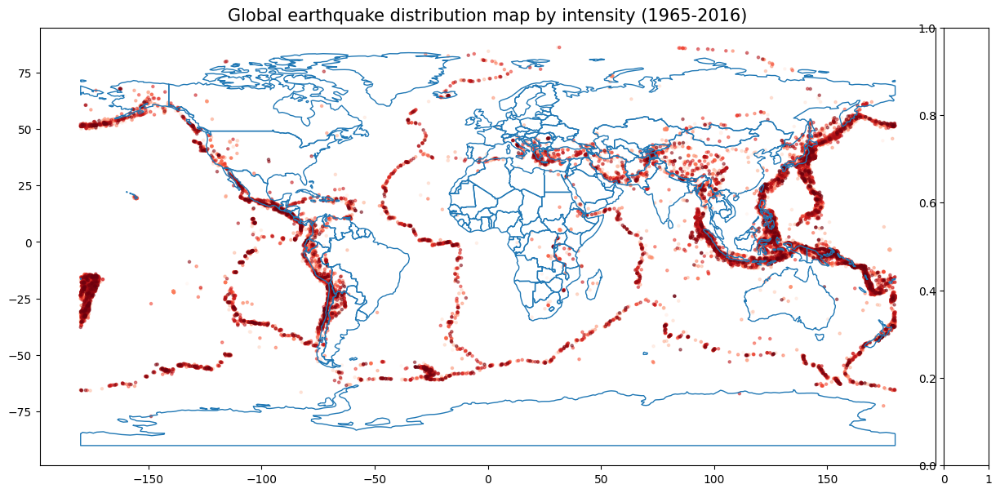

In [13]:
# יצירת GeoDataFrame לצורך ויזואליזציה
gdf = gpd.GeoDataFrame(earthquake_data_cleaned, geometry=gpd.points_from_xy(earthquake_data_cleaned['Longitude'], earthquake_data_cleaned['Latitude']))

# טעינת מפת העולם
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# יצירת המפה
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# ציור מפת העולם
world.boundary.plot(ax=ax, linewidth=1)

# ציור רעידות האדמה עם שימוש בצבעים לפי עוצמה
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
gdf.plot(ax=ax, marker='o', c=gdf['Magnitude'], cmap='Reds', markersize=5, alpha=0.5, legend=True, cax=cax)

# הוספת כותרת
ax.set_title('Global earthquake distribution map by intensity (1965-2016)', fontsize=15)

# הצגת המפה
plt.show()

# **הגדרת אזורים גיאוגרפיים ויצירת מילונים לאיסוף תוצאות**


>חילקתי את העולם לאזורים גיאוגרפיים מוגדרים מראש, והכנתי מילונים לאיסוף תוצאות המודולריות והמרכזיות עבור כל עשור ואזור.



In [34]:
# פונקציה לסינון נתונים לפי גבולות גיאוגרפיים מוגדרים
def filter_region(data, lat_min, lat_max, lon_min, lon_max):
    return data[(data['Latitude'] >= lat_min) & (data['Latitude'] <= lat_max) &
                (data['Longitude'] >= lon_min) & (data['Longitude'] <= lon_max)]

# הגדרת האזורים הגיאוגרפיים העיקריים
pacific_asia = filter_region(earthquake_data_cleaned, -60, 60, 100, -70)
north_america = filter_region(earthquake_data_cleaned, 10, 80, -170, -50)
south_america = filter_region(earthquake_data_cleaned, -60, 15, -90, -30)
europe_africa = filter_region(earthquake_data_cleaned, 30, 70, -30, 60)
middle_east_asia = filter_region(earthquake_data_cleaned, 10, 40, 30, 100)
africa_oceania = filter_region(earthquake_data_cleaned, -60, 0, 10, 180)

# יצירת מילונים לאיסוף מודולריות ומדדי מרכזיות לפי אזור ועשור
modularity_dict = {
    "North America": [],
    "South America": [],
    "Europe & North Africa": [],
    "Middle East & South Asia": [],
    "Southern Africa & Oceania": []
}

degree_centrality_dict = {
    "North America": [],
    "South America": [],
    "Europe & North Africa": [],
    "Middle East & South Asia": [],
    "Southern Africa & Oceania": []
}


#**בניית רשתות, חישוב מודולריות וניתוח מרכזיות**


> בניתי רשתות שבהן הצמתים מייצגים רעידות אדמה, והקשתות מייצגות קשרים גיאוגרפיים בין רעידות אדמה קרובות. חישבתי את המודולריות של הרשתות וזהיתי את הקהילות באמצעות אלגוריתם Louvain. בנוסף, חישבתי מדדי מרכזיות שונים כדי להבין אילו צמתים היו חשובים ביותר בכל רשת.



In [35]:
# פונקציה לחישוב מדדי מרכזיות שונים עבור הרשת
def analyze_centrality(G):
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)
    try:
        eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)
    except nx.PowerIterationFailedConvergence:
        print("Failed to converge, switching to numpy-based eigenvector centrality")
        eigenvector_centrality = nx.eigenvector_centrality_numpy(G)
    return {
        "Degree Centrality": degree_centrality,
        "Betweenness Centrality": betweenness_centrality,
        "Closeness Centrality": closeness_centrality,
        "Eigenvector Centrality": eigenvector_centrality
    }

# פונקציה לבניית הרשתות, חישוב מודולריות וניתוח מרכזיות
def build_and_analyze_network(data, region_name, decade):
    if data.empty:
        print(f"No data for {region_name} in the {decade}s.")
        return

    coordinates = list(zip(data['Latitude'], data['Longitude']))
    tree = KDTree(coordinates)

    # בניית רשת
    G = nx.Graph()
    for i, (lat, lon) in enumerate(coordinates):
        G.add_node(i, pos=(lat, lon))

    # הוספת קשתות לפי קרבה גיאוגרפית
    threshold_distance = 500  # סף מרחק בקילומטרים
    for i, (lat, lon) in enumerate(coordinates):
        distances, indices = tree.query([lat, lon], k=10, distance_upper_bound=threshold_distance)
        for dist, idx in zip(distances, indices):
            if dist < threshold_distance and i != idx and idx < len(coordinates):
                G.add_edge(i, idx, weight=dist)

    # זיהוי קהילות וחישוב מודולריות
    partition = community_louvain.best_partition(G)
    modularity = community_louvain.modularity(partition, G)

    # הוספת המודולריות למילון
    if region_name in modularity_dict:
        modularity_dict[region_name].append(modularity)

    print(f"Region: {region_name}, Decade: {decade}, Modularity: {modularity}")

    # ניתוח מרכזיות והוספת המרכזיות הגבוהה ביותר למילון
    centrality_measures = analyze_centrality(G)
    top_degree_centrality = max(centrality_measures['Degree Centrality'].values())
    if region_name in degree_centrality_dict:
        degree_centrality_dict[region_name].append(top_degree_centrality)

    # הצגת מדדי המרכזיות
    print(f"Top Degree Centrality for {region_name}, Decade: {decade}")
    print(sorted(centrality_measures['Degree Centrality'].items(), key=lambda x: x[1], reverse=True)[:5])

    # ציור הרשת עם הקהילות
    pos = nx.spring_layout(G)
    plt.figure(figsize=(10, 10))
    nx.draw_networkx_nodes(G, pos, node_size=50, cmap=plt.cm.jet, node_color=list(partition.values()))
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    plt.title(f"Communities in the {region_name} ({decade}s) Earthquake Network")
    plt.show()

     # הוספת הוויזואליזציה של מדדי המרכזיות
    plot_centralities(centrality_measures, region_name, decade)  # גרף מרכזיות
    plot_heatmaps(centrality_measures, region_name, decade)



# **ניתוח לפי עשורים עבור כל אזור**


>הרצתי את הניתוח עבור כל עשור ואזור גיאוגרפי, ואספתי את התוצאות במילונים שהכנתי מראש.



Analyzing region: North America
Region: North America, Decade: 1960.0, Modularity: 0.7827018798992911
Failed to converge, switching to numpy-based eigenvector centrality
Top Degree Centrality for North America, Decade: 1960.0
[(75, 0.1349206349206349), (31, 0.12698412698412698), (76, 0.12698412698412698), (110, 0.12698412698412698), (32, 0.11904761904761904)]


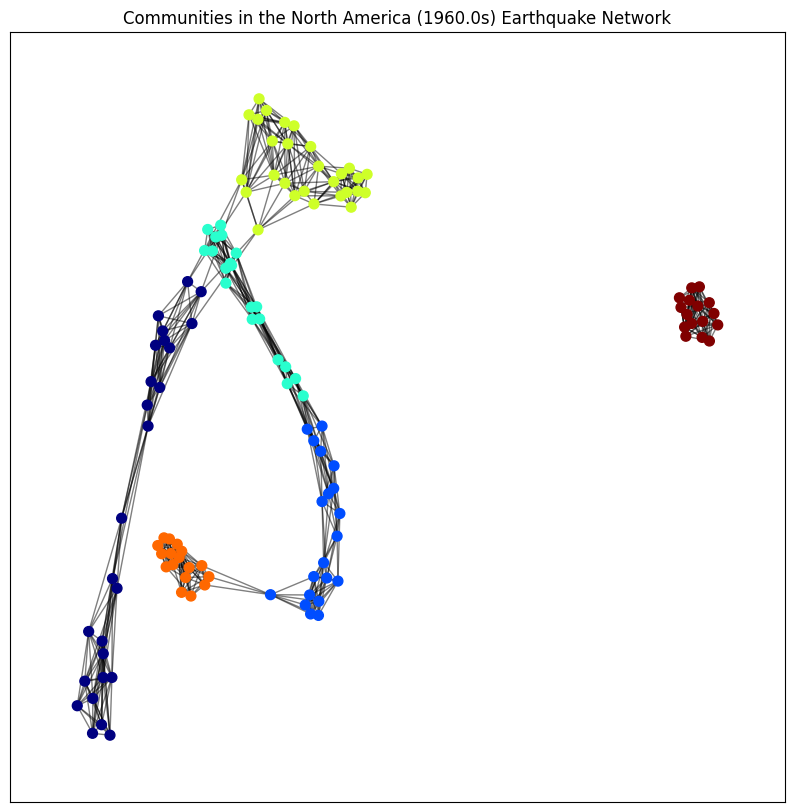

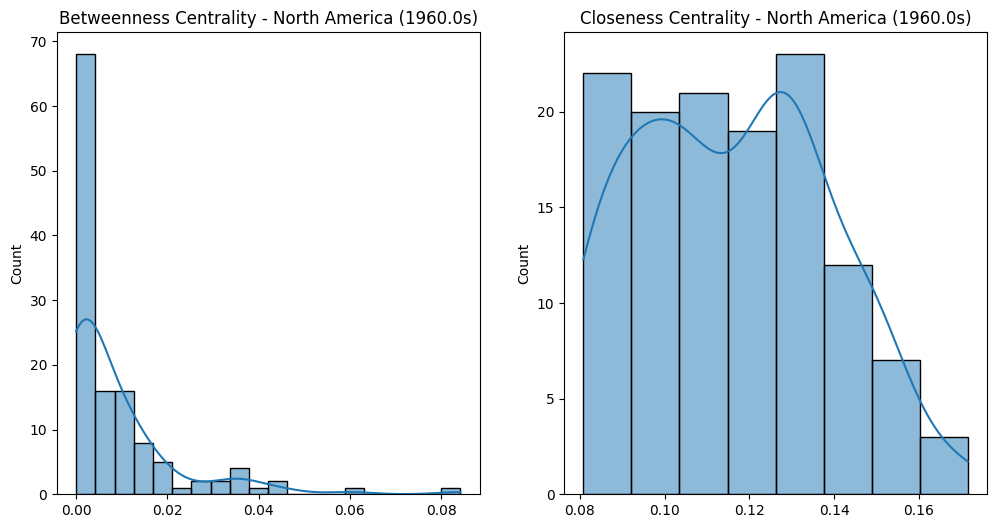

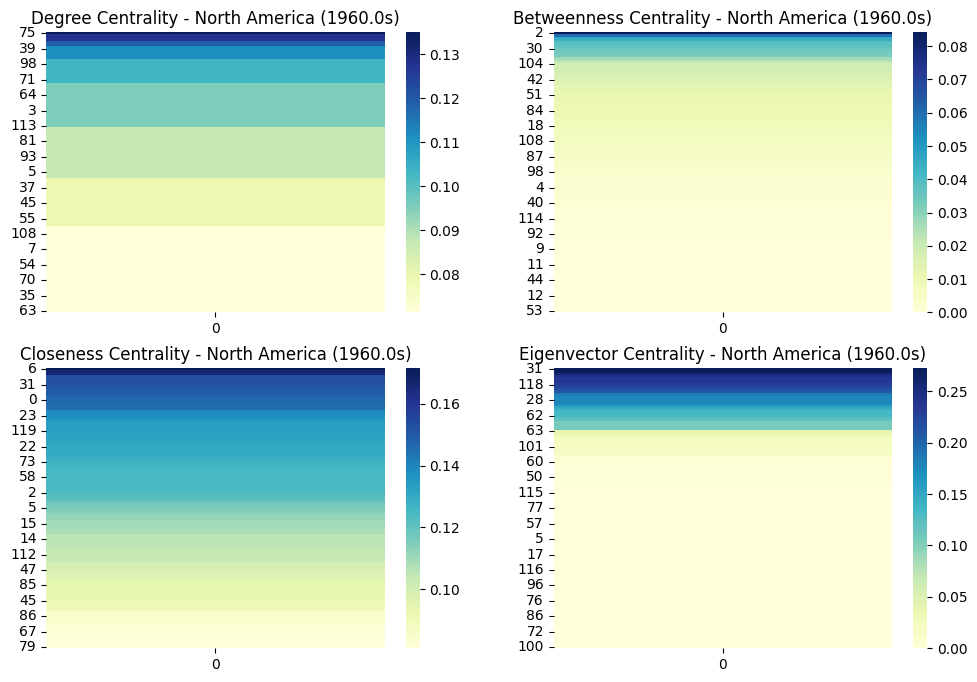

Region: North America, Decade: 1970.0, Modularity: 0.7902824378757239
Top Degree Centrality for North America, Decade: 1970.0
[(167, 0.07228915662650602), (24, 0.0682730923694779), (77, 0.0682730923694779), (172, 0.0682730923694779), (190, 0.0682730923694779)]


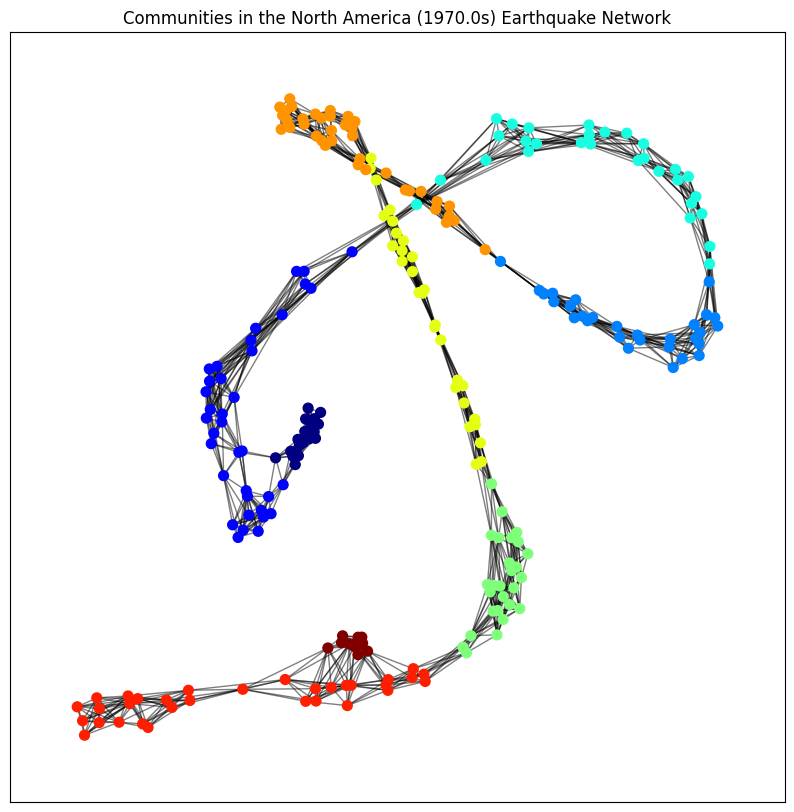

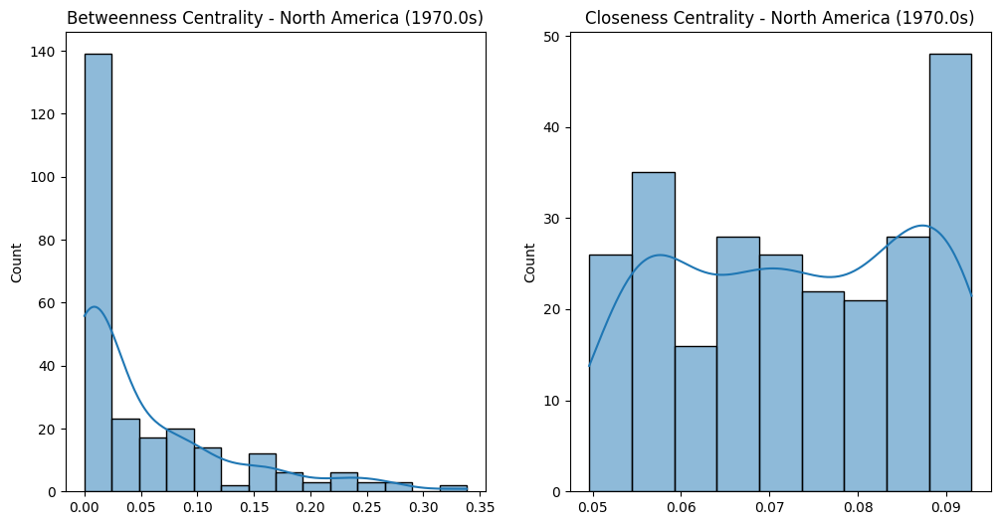

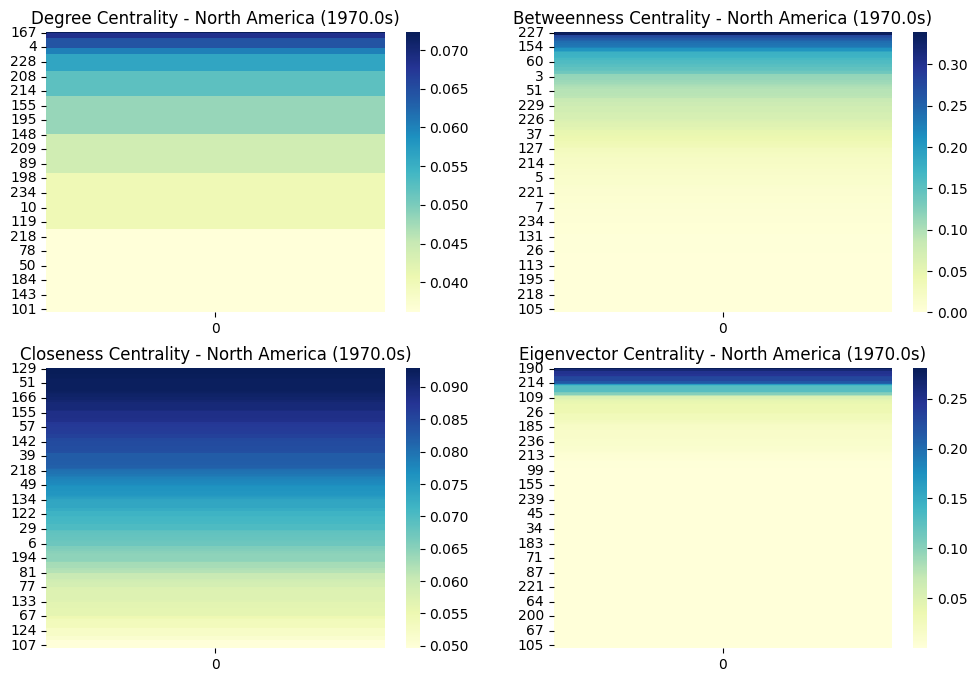

Region: North America, Decade: 1980.0, Modularity: 0.8185752793589548
Top Degree Centrality for North America, Decade: 1980.0
[(26, 0.0670926517571885), (91, 0.054313099041533544), (161, 0.054313099041533544), (280, 0.054313099041533544), (23, 0.051118210862619806)]


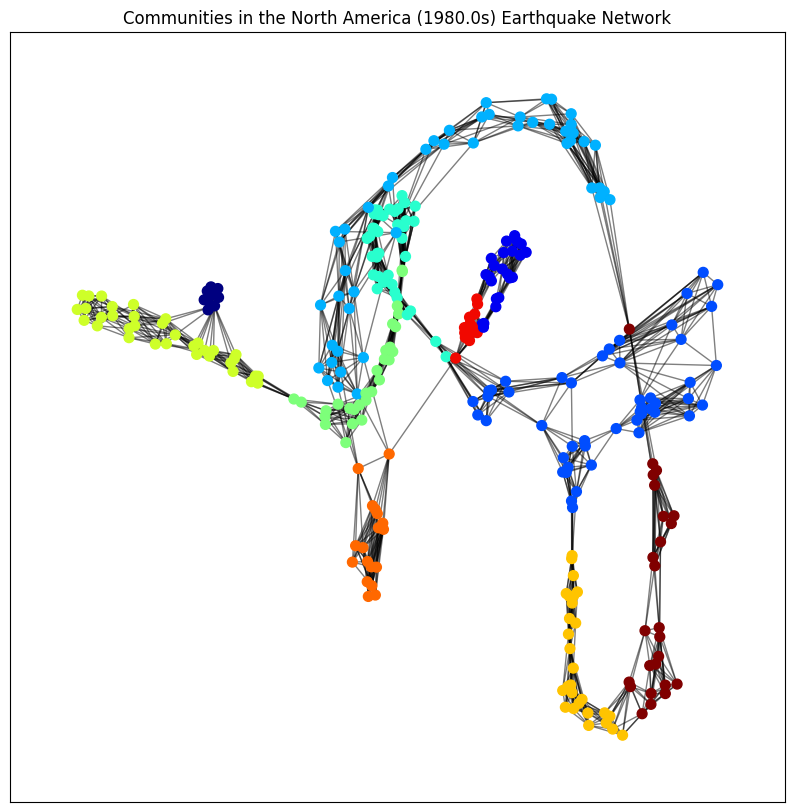

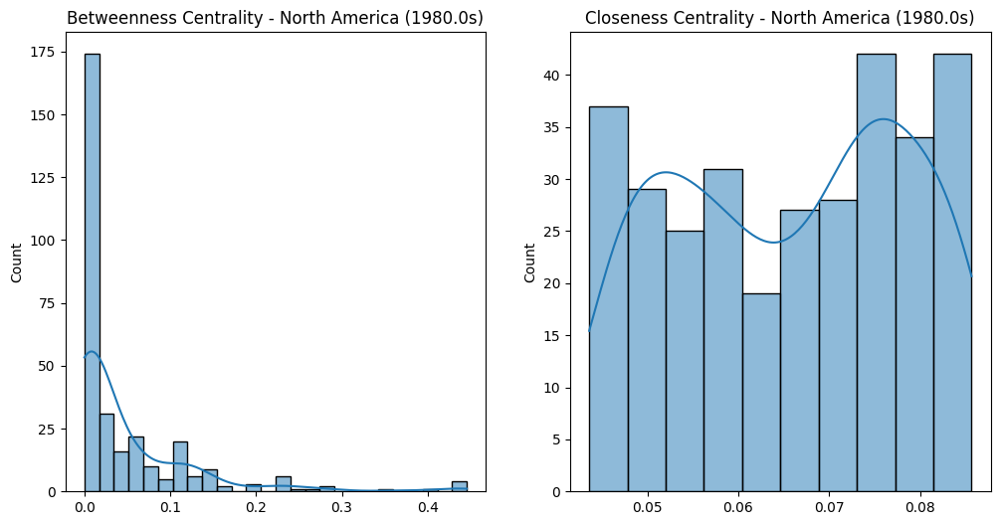

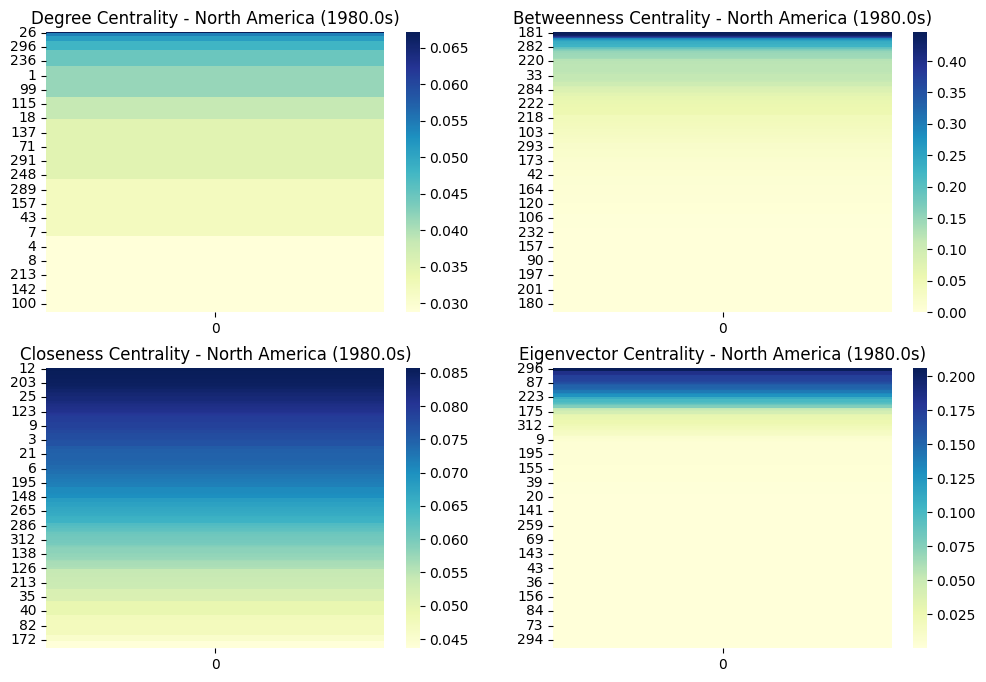

Region: North America, Decade: 1990.0, Modularity: 0.8336624283460351
Top Degree Centrality for North America, Decade: 1990.0
[(350, 0.05223880597014925), (392, 0.0472636815920398), (155, 0.04477611940298507), (356, 0.04477611940298507), (13, 0.04228855721393035)]


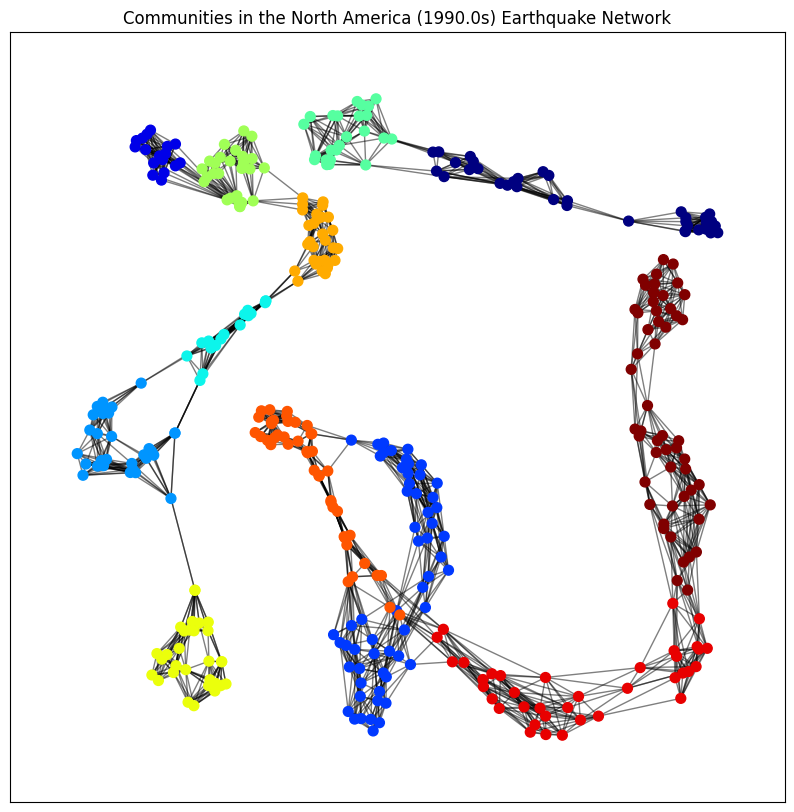

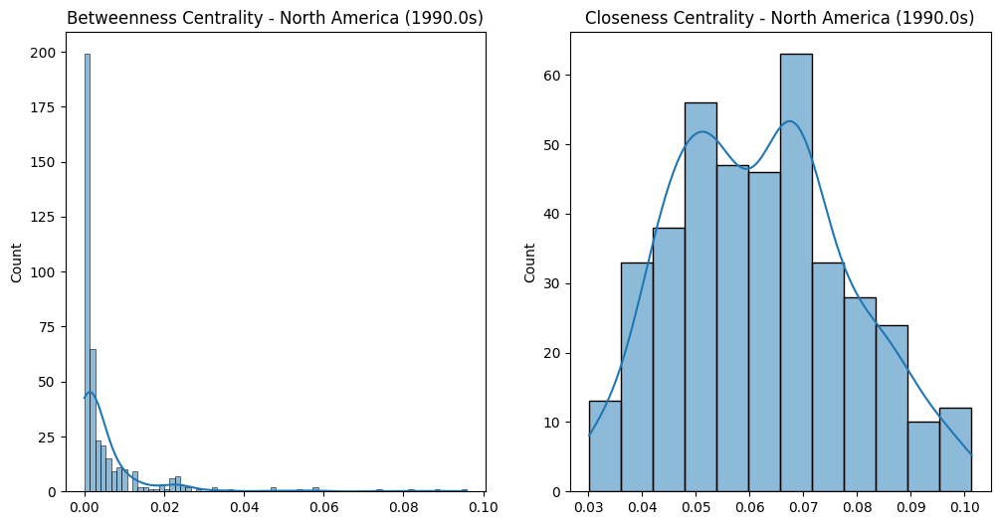

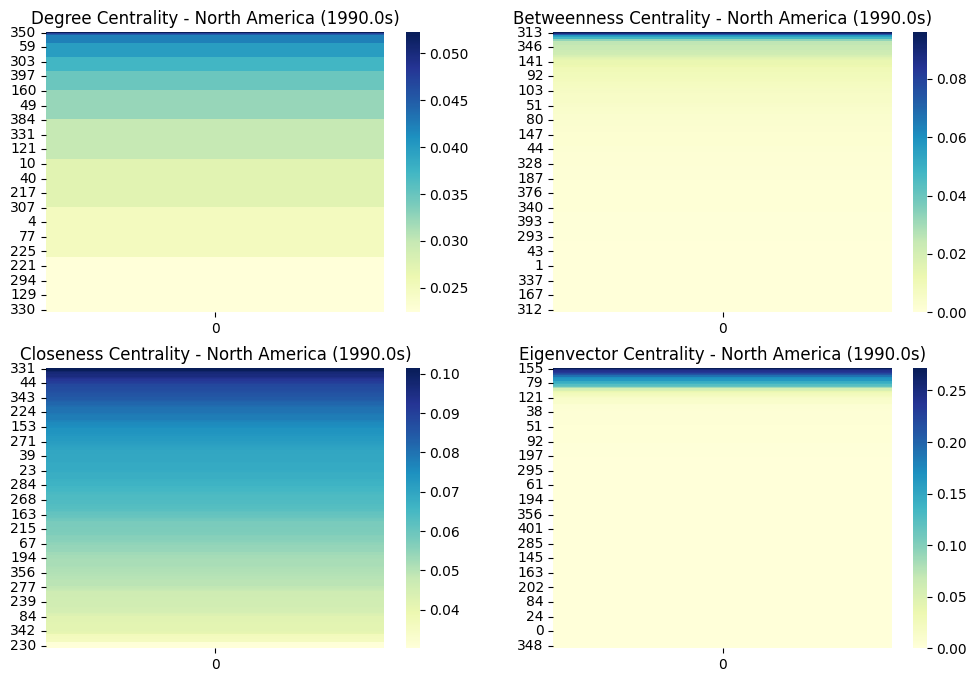

Region: North America, Decade: 2000.0, Modularity: 0.7759506351259075
Top Degree Centrality for North America, Decade: 2000.0
[(268, 0.0547550432276657), (35, 0.05187319884726224), (40, 0.05187319884726224), (52, 0.04899135446685879), (57, 0.04899135446685879)]


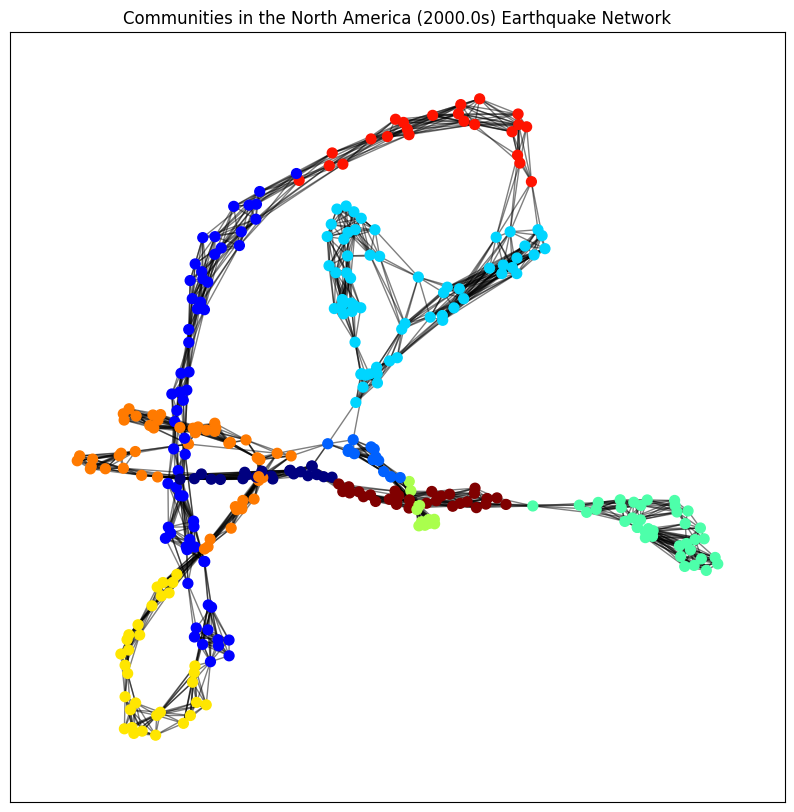

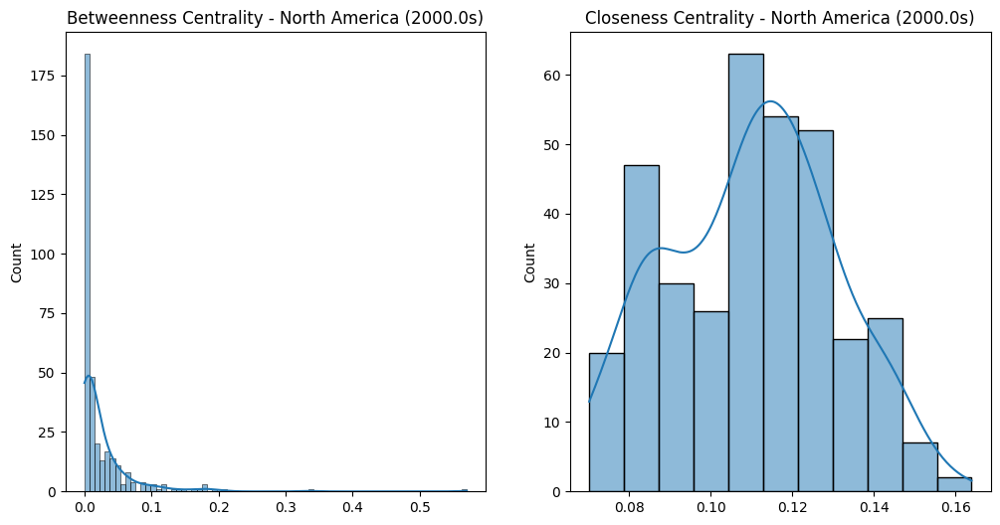

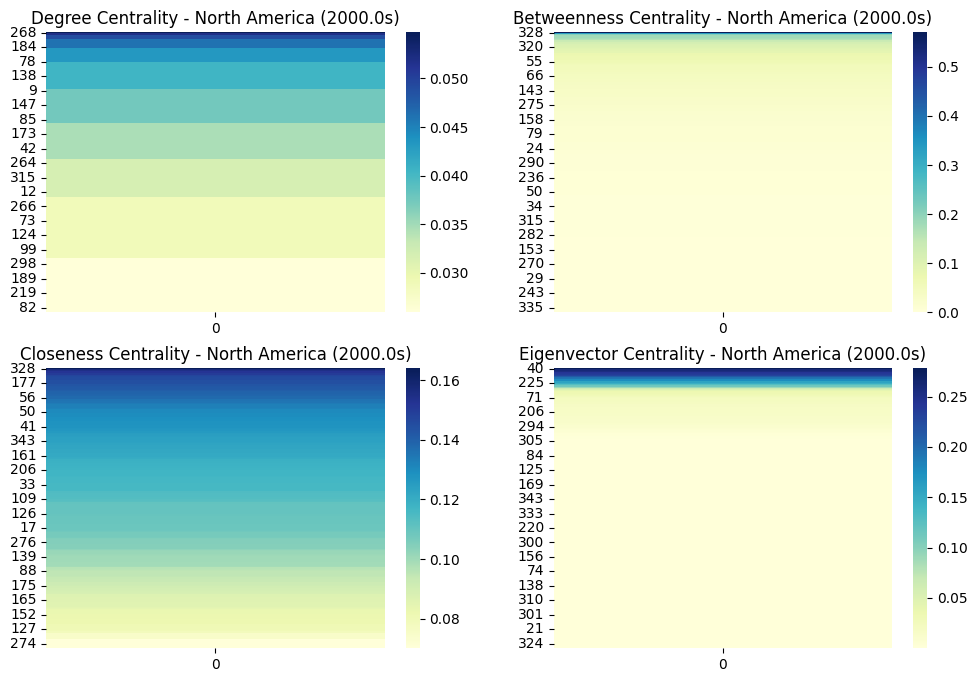

Region: North America, Decade: 2010.0, Modularity: 0.8201752317782807
Top Degree Centrality for North America, Decade: 2010.0
[(245, 0.06884057971014493), (28, 0.06521739130434782), (37, 0.06159420289855073), (73, 0.06159420289855073), (145, 0.06159420289855073)]


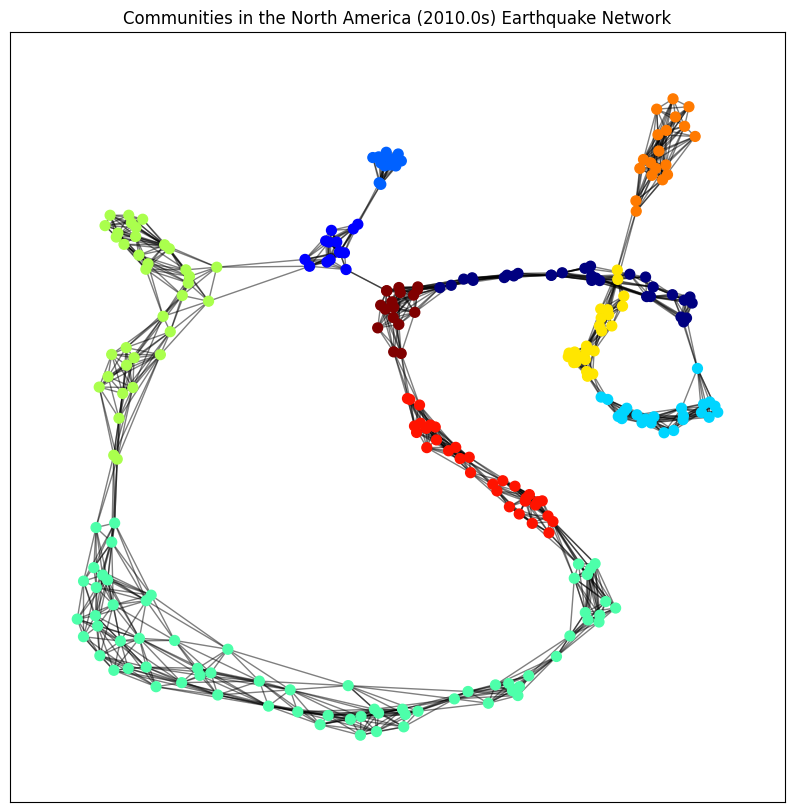

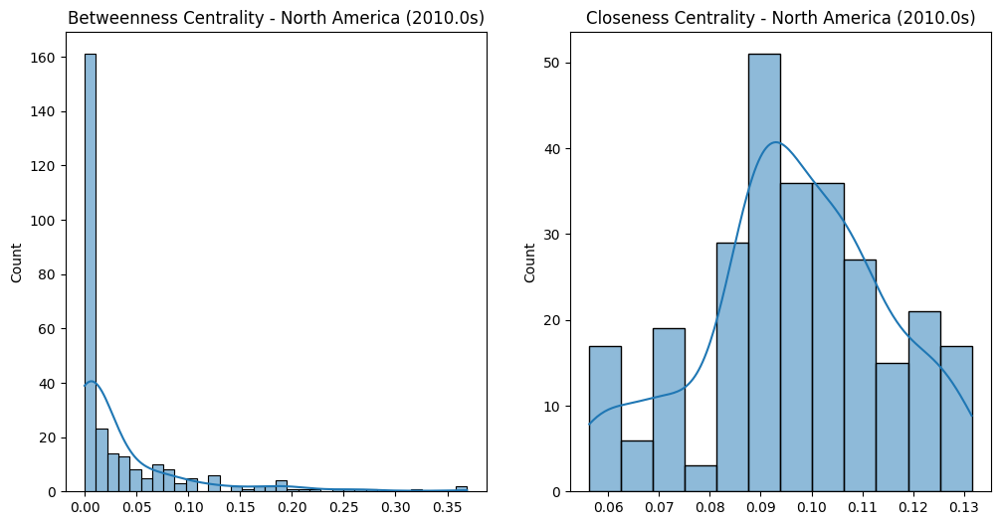

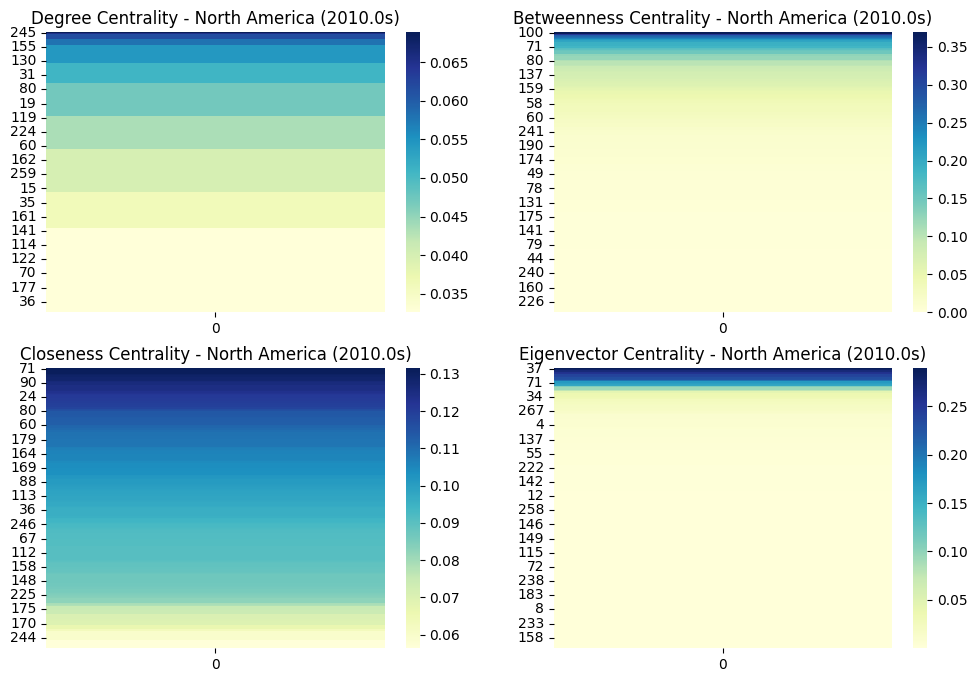

Analyzing region: South America
Region: South America, Decade: 1960.0, Modularity: 0.6690243689459434
Top Degree Centrality for South America, Decade: 1960.0
[(22, 0.15966386554621848), (51, 0.14285714285714285), (15, 0.13445378151260504), (104, 0.13445378151260504), (41, 0.12605042016806722)]


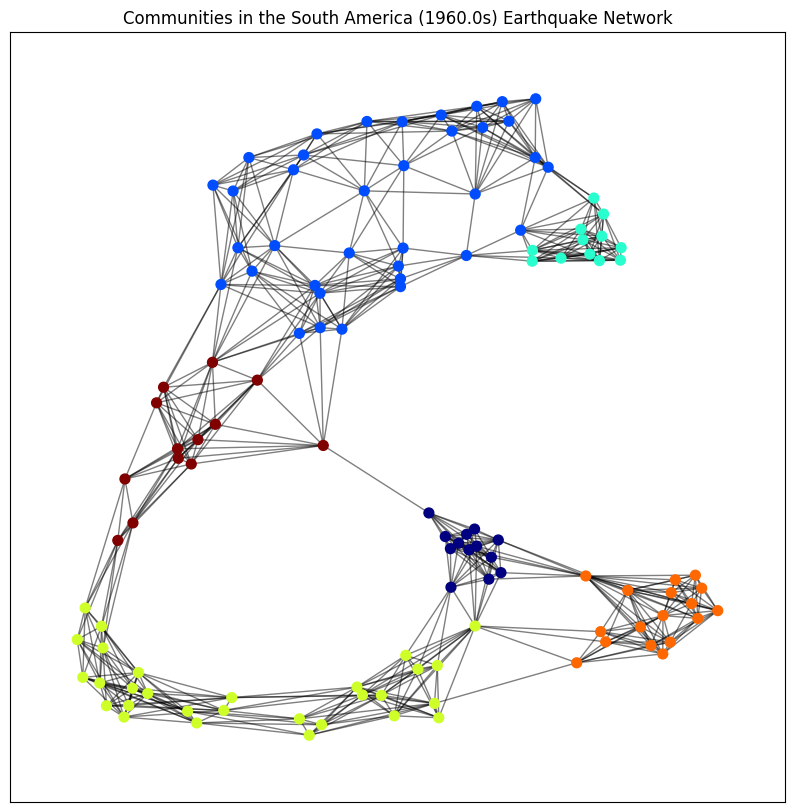

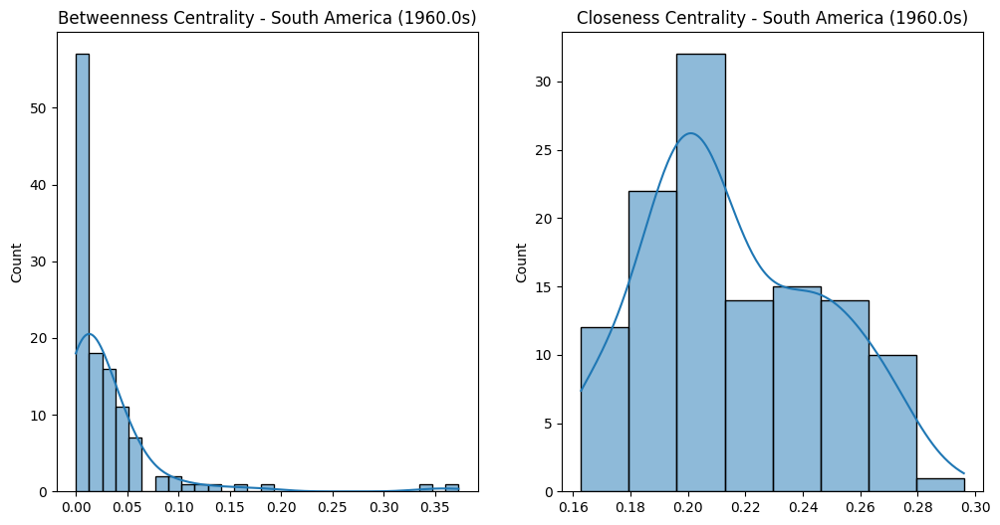

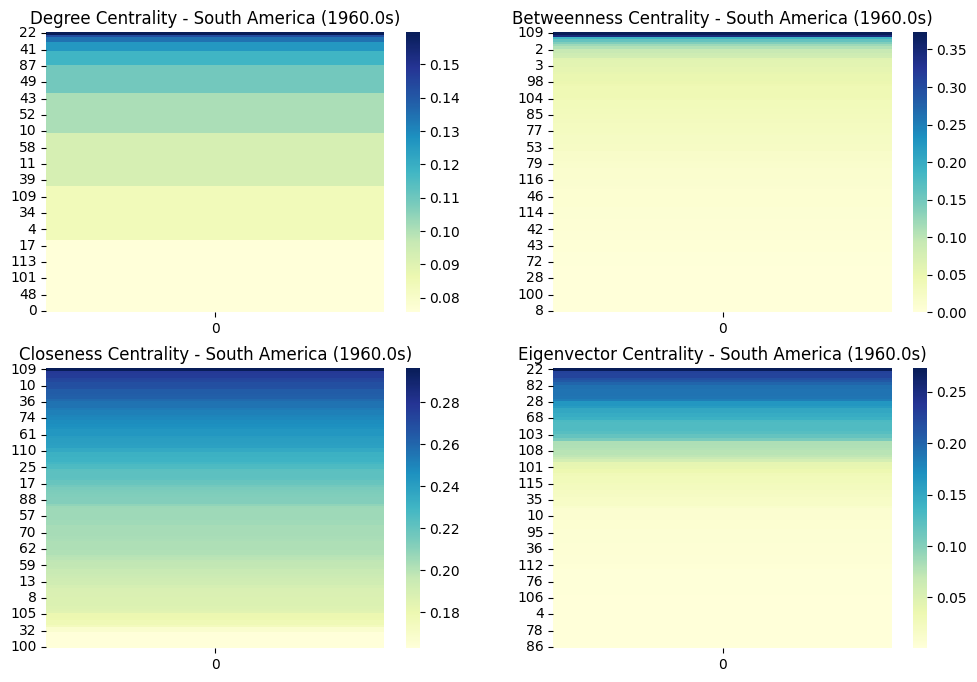

Region: South America, Decade: 1970.0, Modularity: 0.8091095175058272
Top Degree Centrality for South America, Decade: 1970.0
[(50, 0.05234159779614325), (165, 0.05234159779614325), (185, 0.049586776859504134), (29, 0.046831955922865015), (289, 0.046831955922865015)]


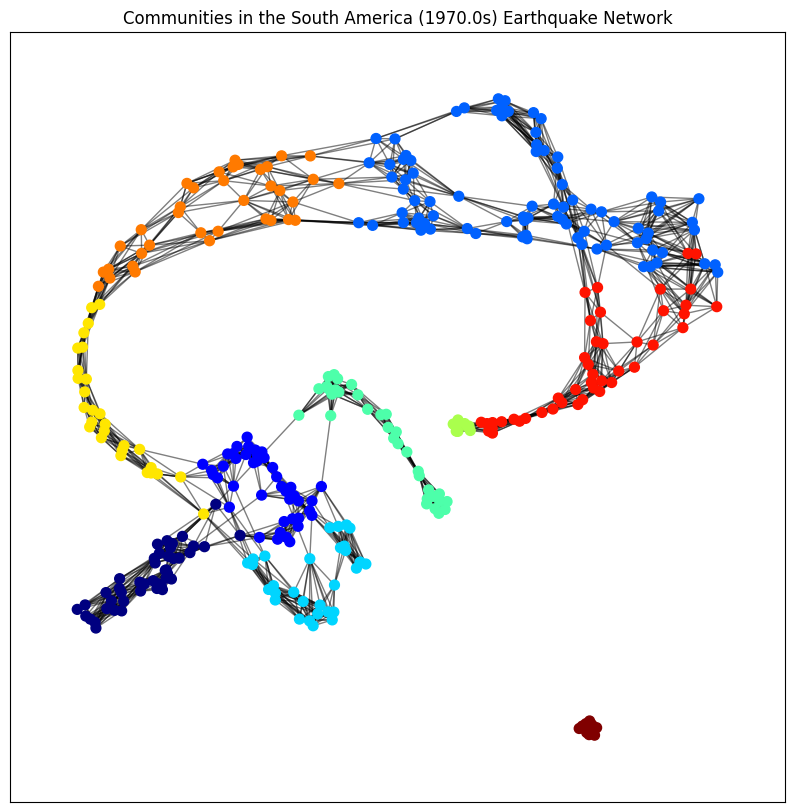

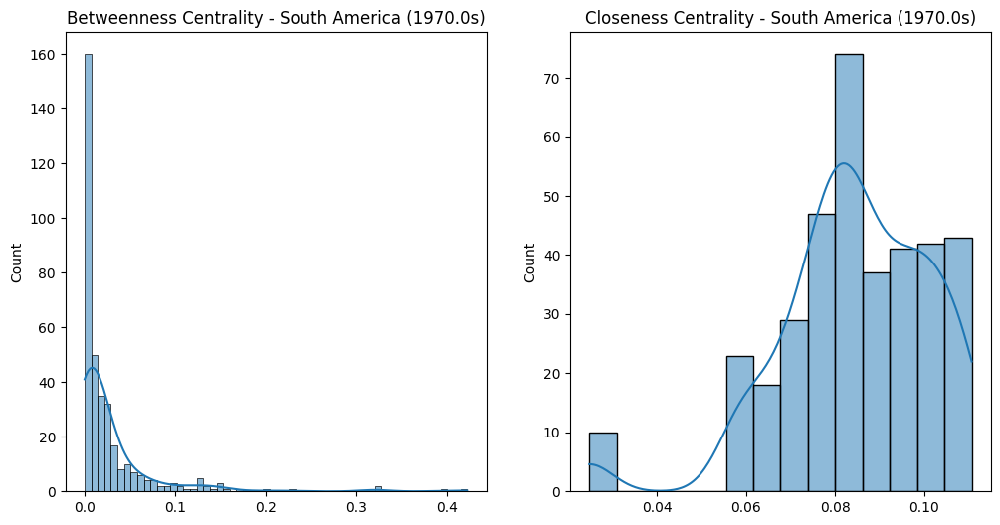

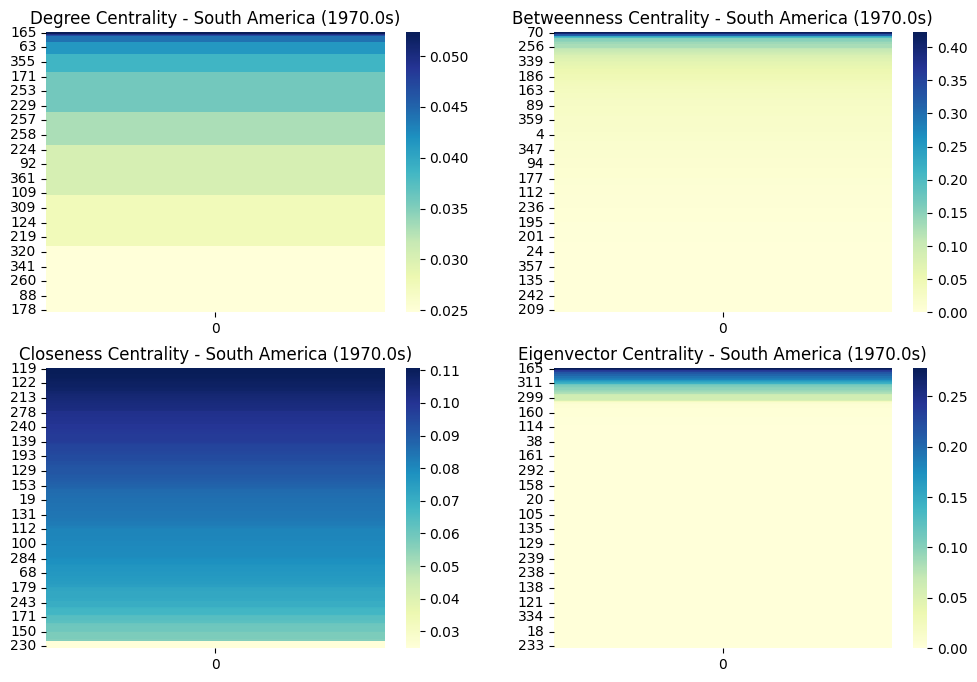

Region: South America, Decade: 1980.0, Modularity: 0.8164683050067267
Top Degree Centrality for South America, Decade: 1980.0
[(170, 0.04245283018867924), (365, 0.04245283018867924), (8, 0.04009433962264151), (243, 0.04009433962264151), (271, 0.04009433962264151)]


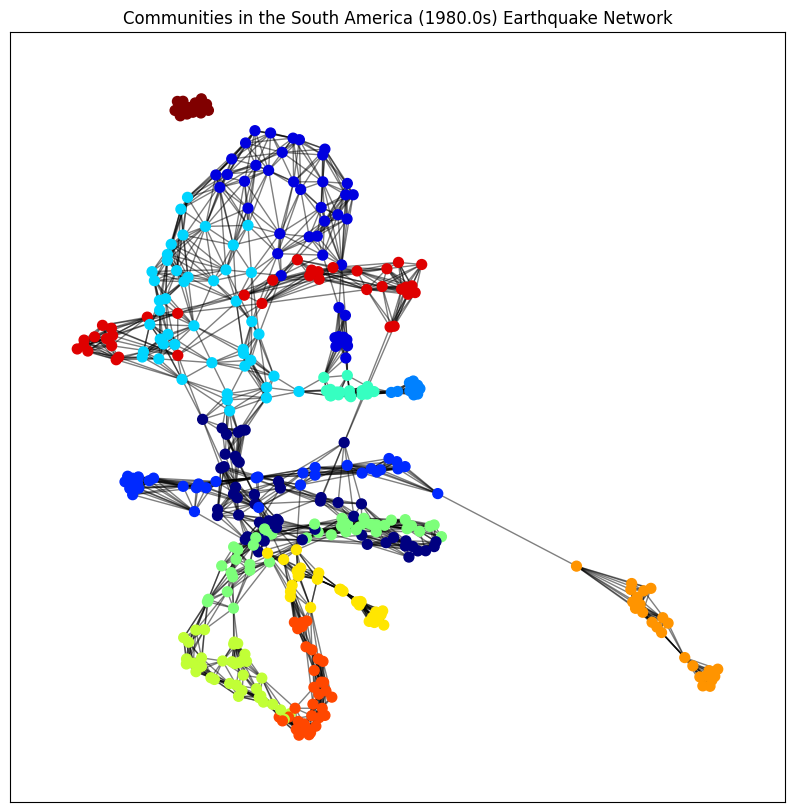

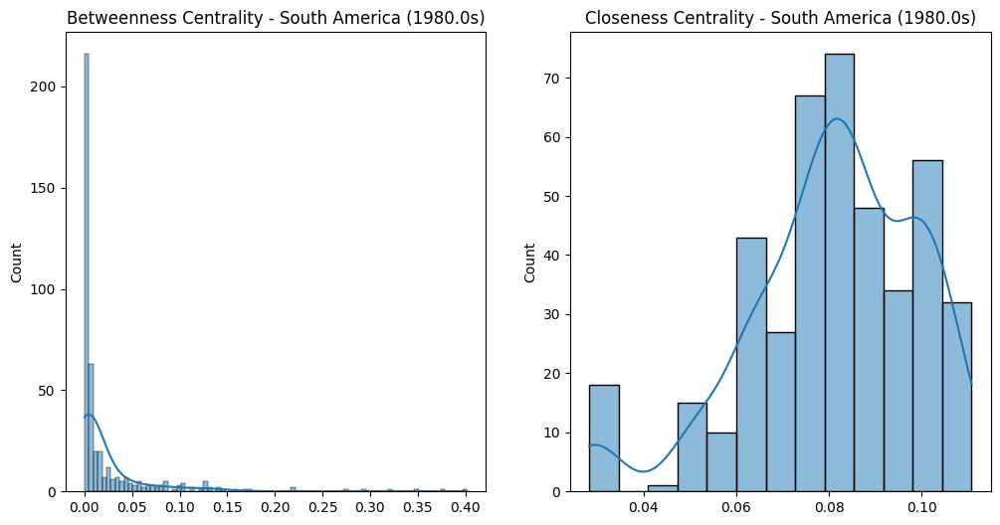

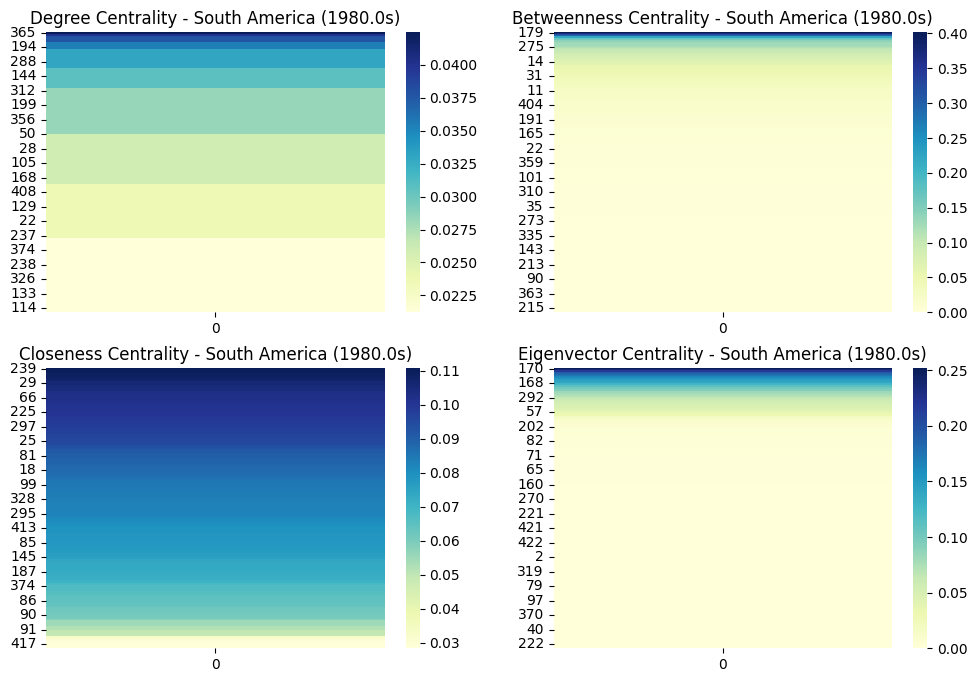

No data for South America in the nans.
Region: South America, Decade: 1990.0, Modularity: 0.8134824147075697
Failed to converge, switching to numpy-based eigenvector centrality
Top Degree Centrality for South America, Decade: 1990.0
[(294, 0.03636363636363636), (303, 0.03636363636363636), (493, 0.03636363636363636), (96, 0.03434343434343434), (144, 0.03434343434343434)]


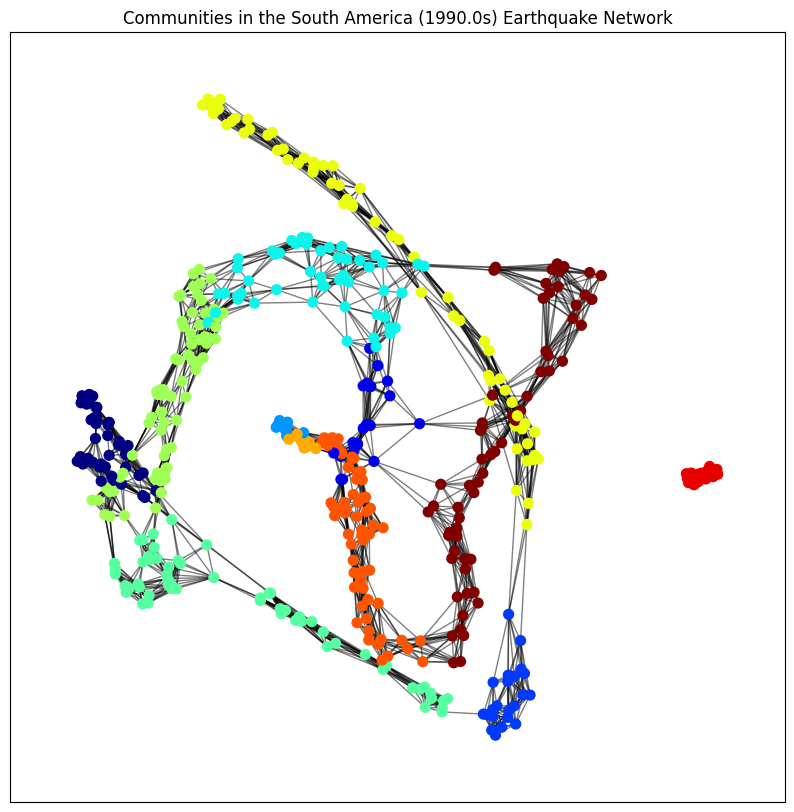

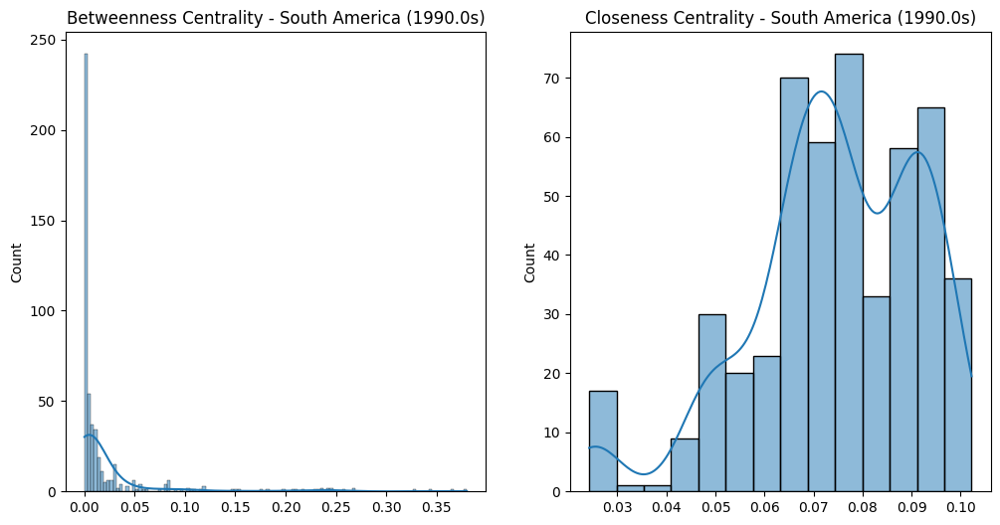

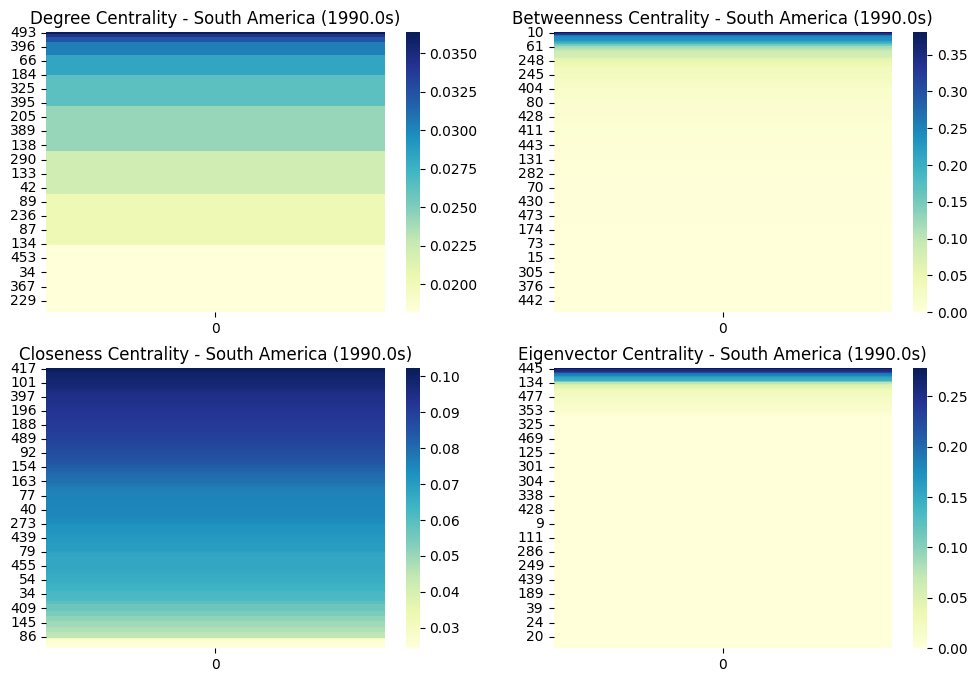

Region: South America, Decade: 2000.0, Modularity: 0.8327686944034935
Top Degree Centrality for South America, Decade: 2000.0
[(472, 0.04025423728813559), (36, 0.038135593220338986), (46, 0.038135593220338986), (330, 0.038135593220338986), (331, 0.038135593220338986)]


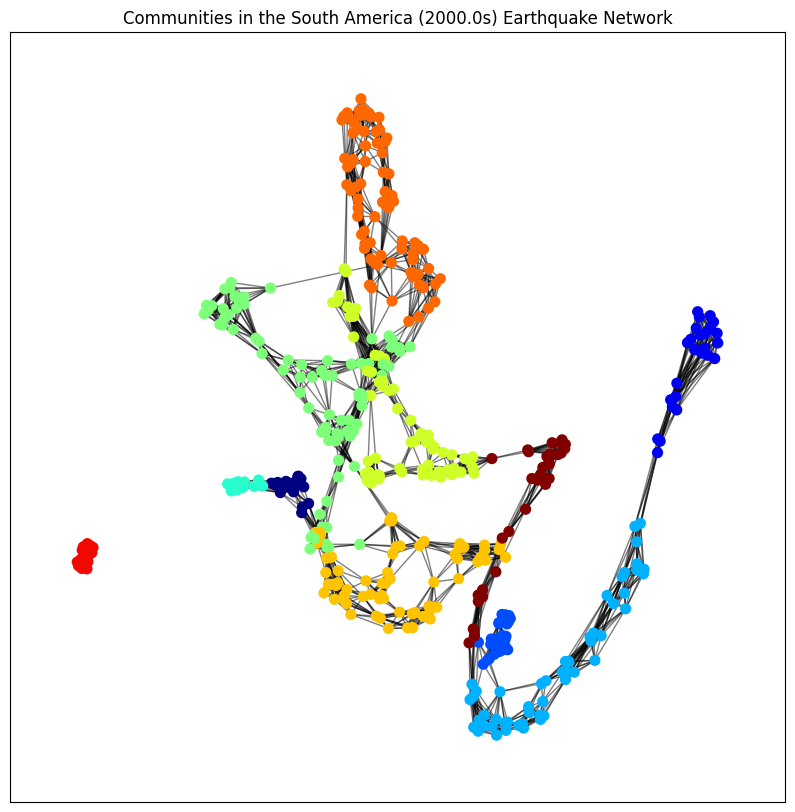

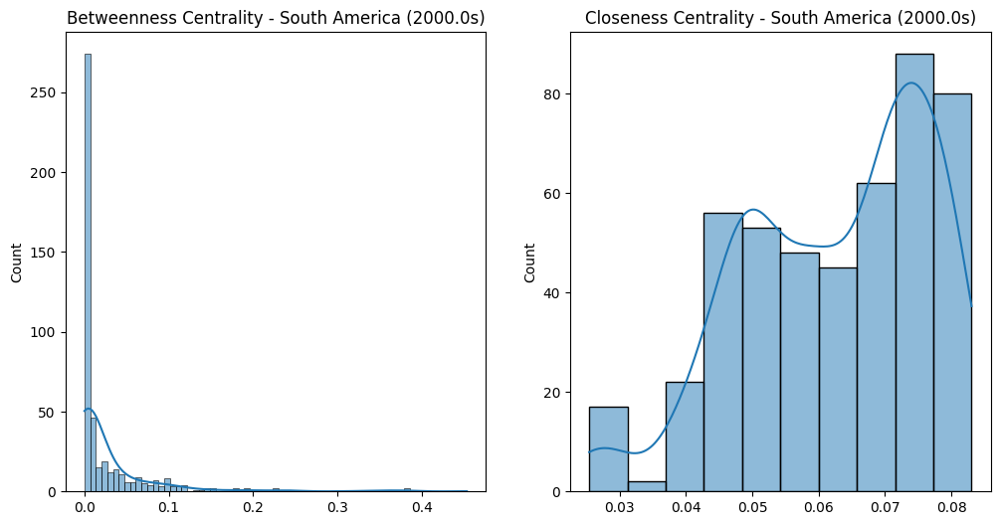

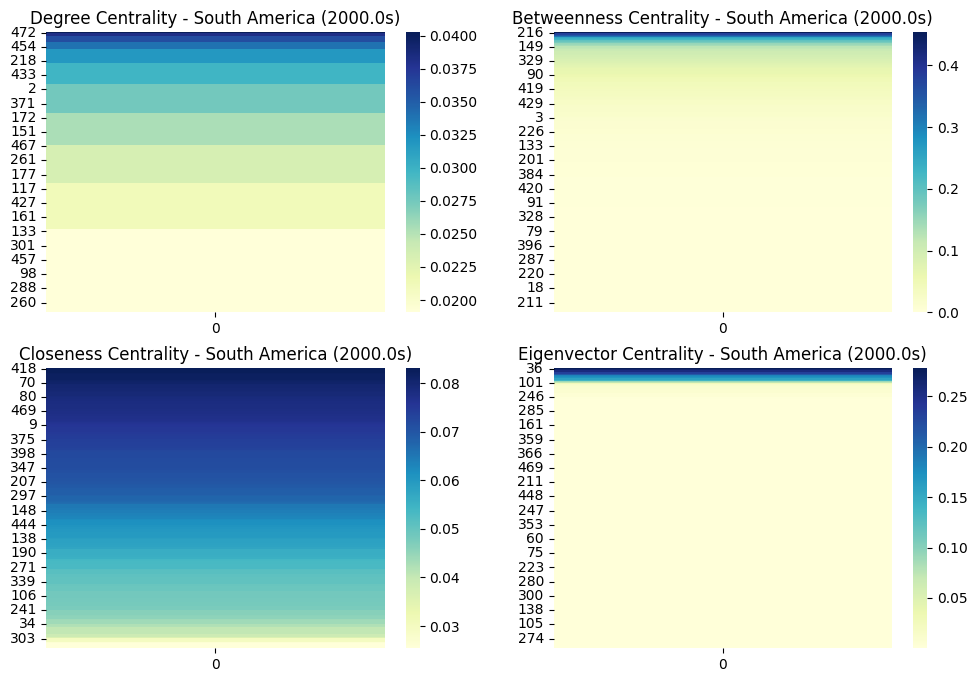

Region: South America, Decade: 2010.0, Modularity: 0.7836081871912937
Top Degree Centrality for South America, Decade: 2010.0
[(62, 0.037578288100208766), (306, 0.037578288100208766), (171, 0.03549060542797494), (174, 0.03549060542797494), (231, 0.03549060542797494)]


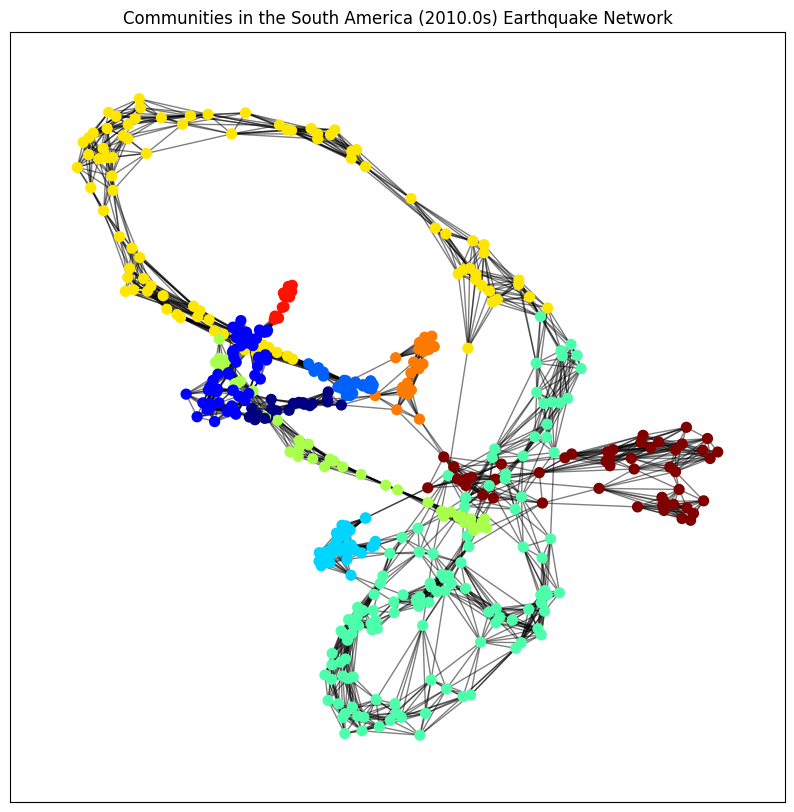

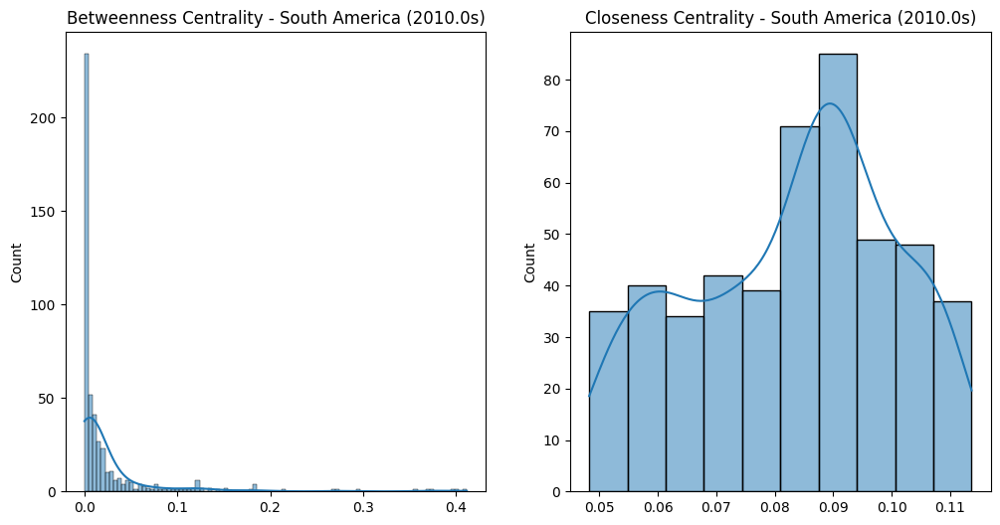

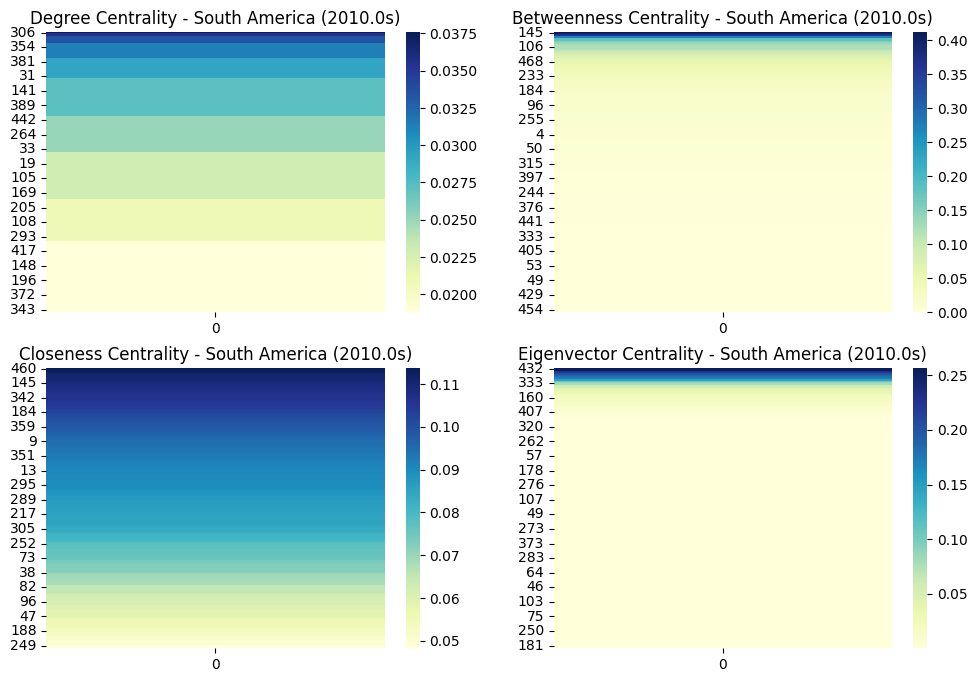

Analyzing region: Europe & North Africa
Region: Europe & North Africa, Decade: 1960.0, Modularity: 0.49766840652864786
Top Degree Centrality for Europe & North Africa, Decade: 1960.0
[(6, 0.37777777777777777), (29, 0.37777777777777777), (43, 0.37777777777777777), (24, 0.35555555555555557), (0, 0.33333333333333337)]


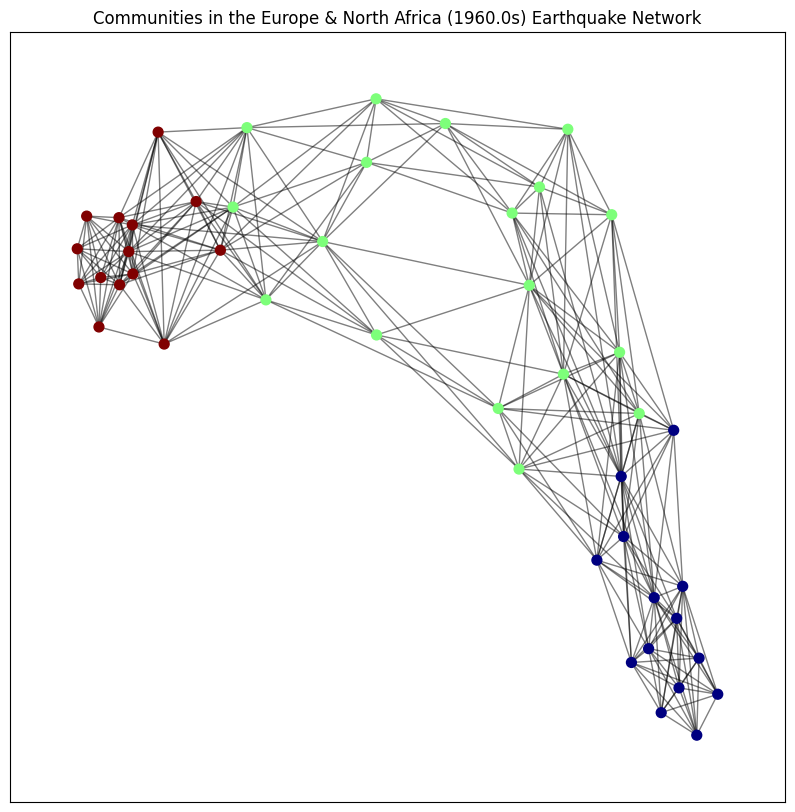

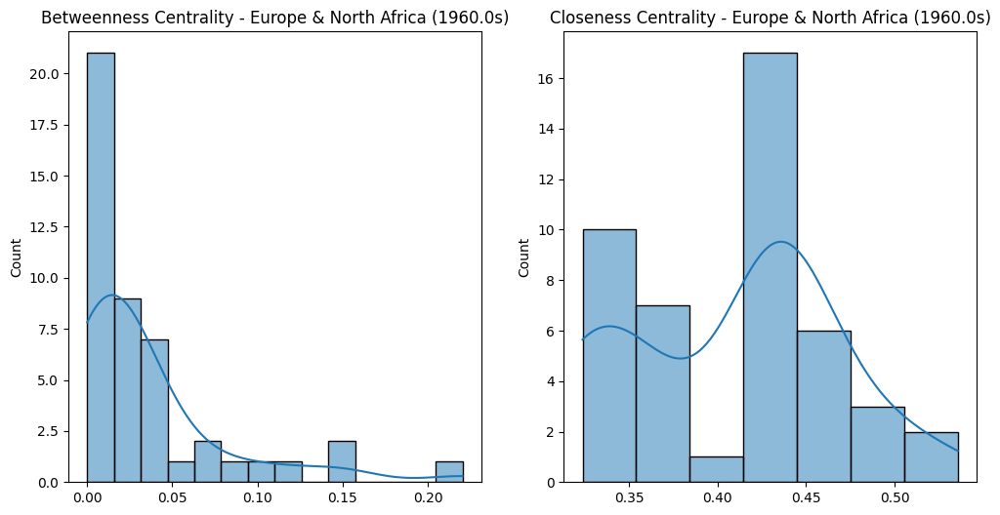

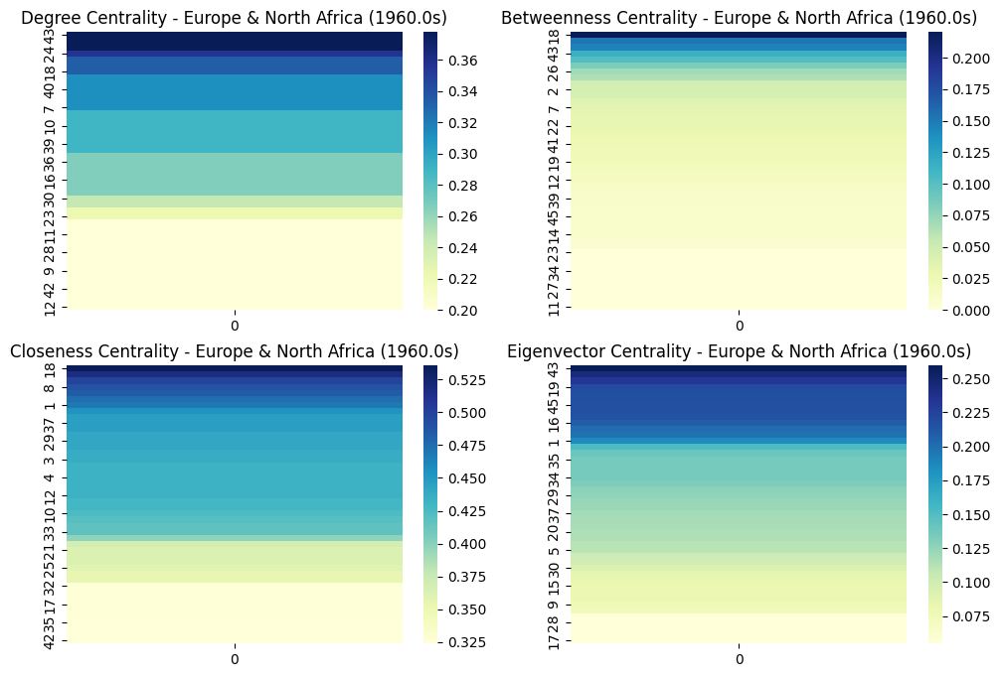

Region: Europe & North Africa, Decade: 1970.0, Modularity: 0.596543961475127
Top Degree Centrality for Europe & North Africa, Decade: 1970.0
[(97, 0.16831683168316833), (22, 0.15841584158415842), (24, 0.15841584158415842), (75, 0.15841584158415842), (76, 0.15841584158415842)]


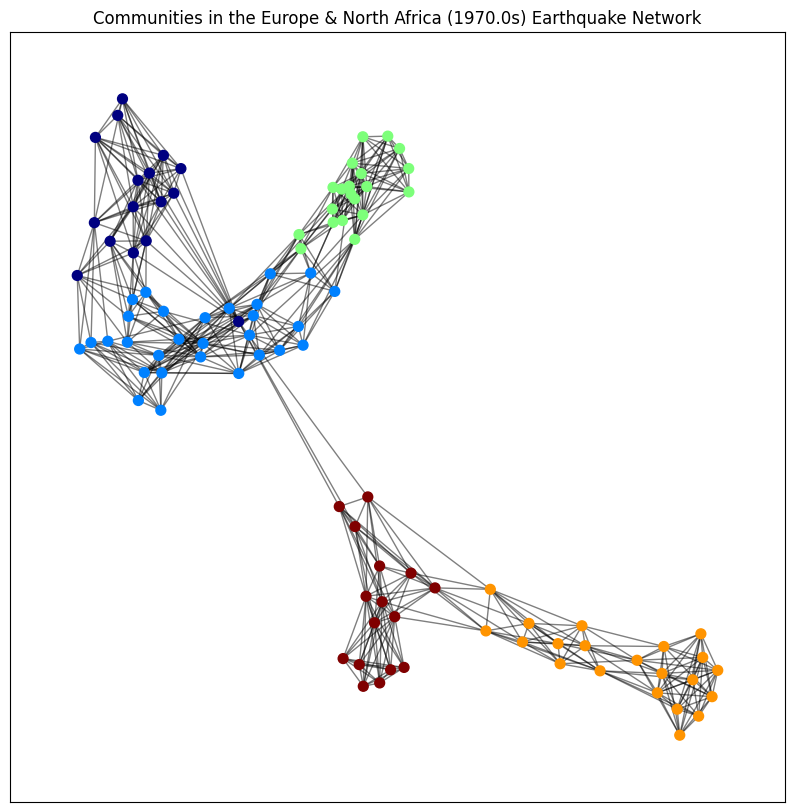

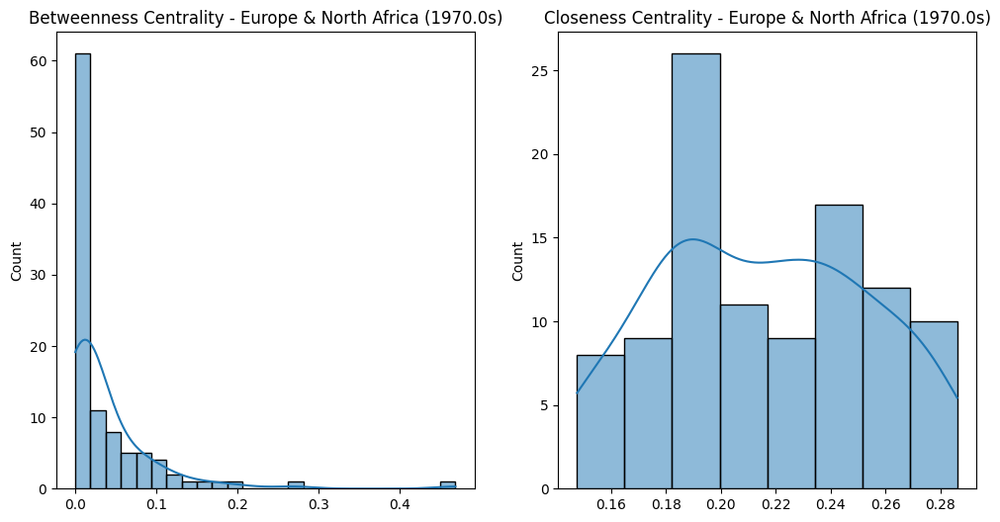

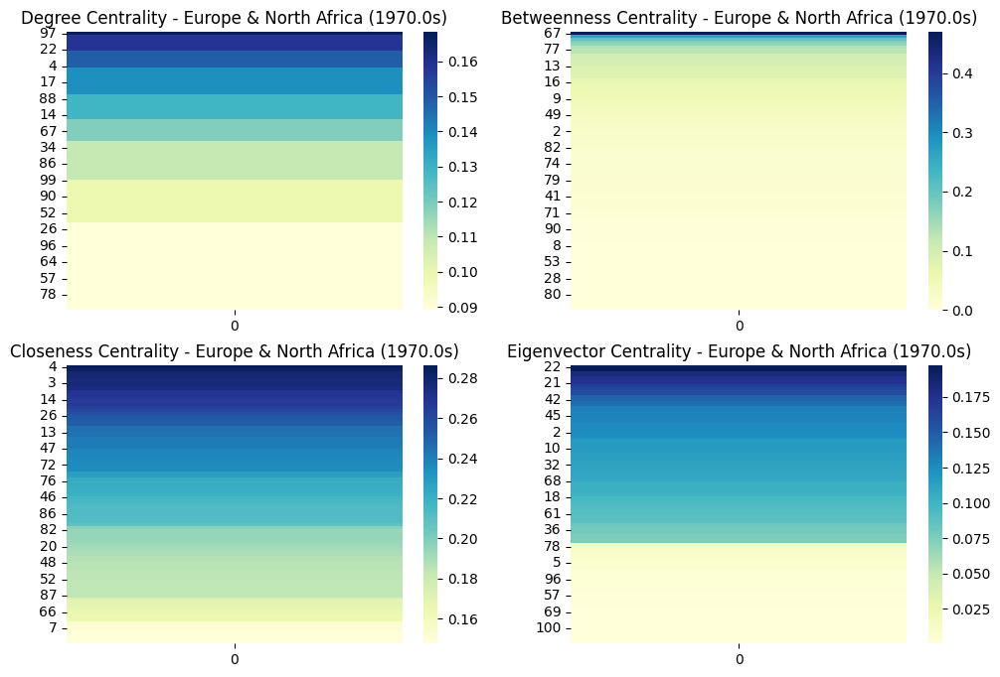

Region: Europe & North Africa, Decade: 1980.0, Modularity: 0.6950762735025823
Top Degree Centrality for Europe & North Africa, Decade: 1980.0
[(51, 0.15315315315315314), (14, 0.14414414414414414), (38, 0.14414414414414414), (45, 0.14414414414414414), (67, 0.13513513513513514)]


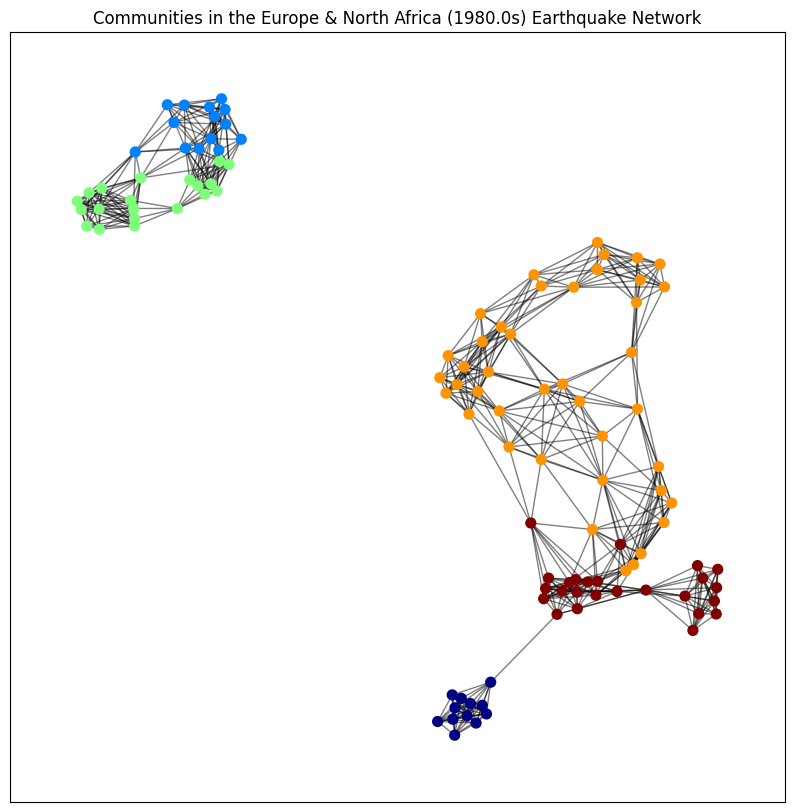

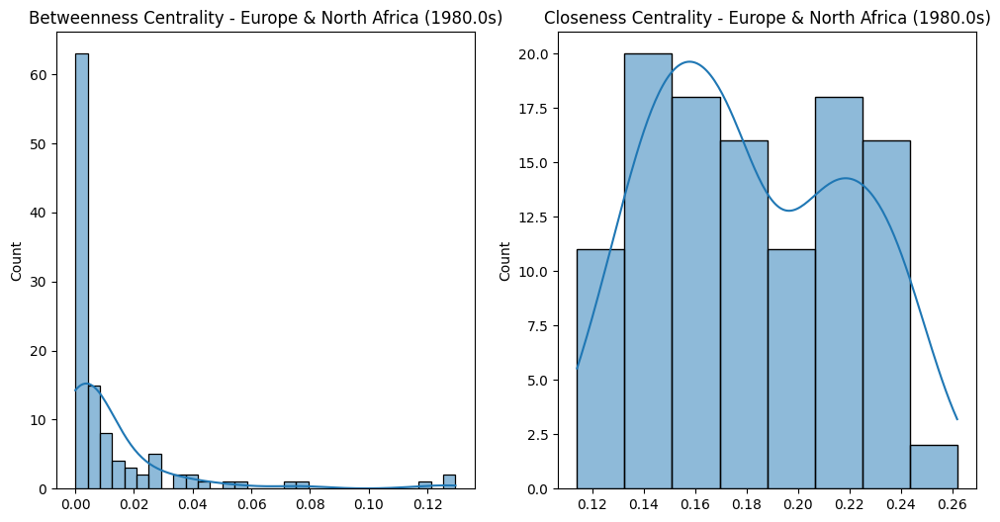

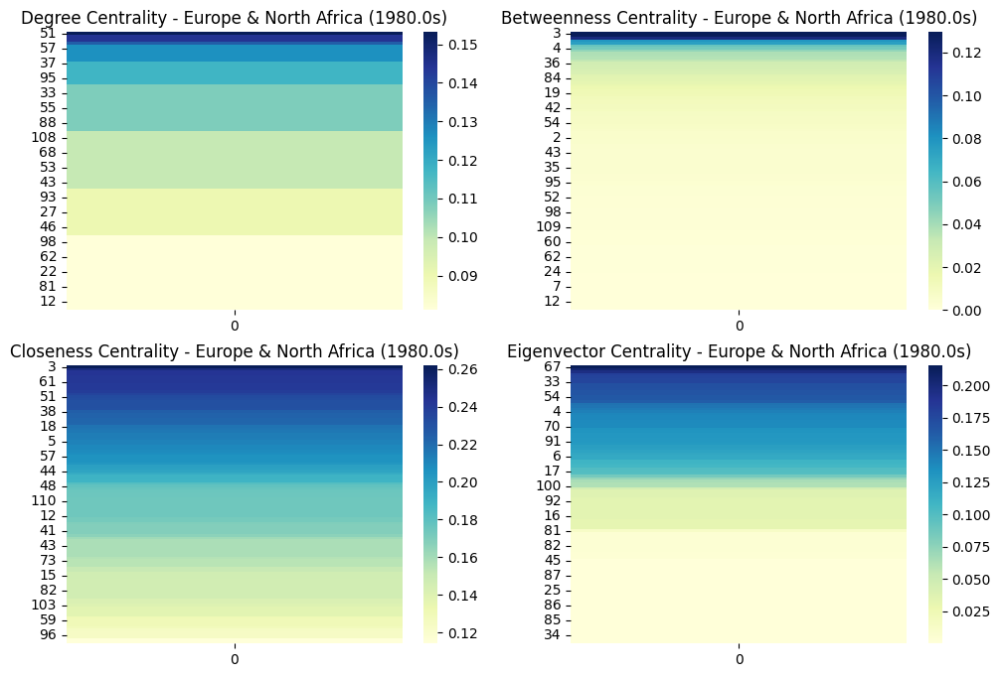

Region: Europe & North Africa, Decade: 1990.0, Modularity: 0.6258584781011046
Top Degree Centrality for Europe & North Africa, Decade: 1990.0
[(7, 0.16666666666666666), (0, 0.14912280701754385), (38, 0.14912280701754385), (39, 0.14912280701754385), (13, 0.13157894736842105)]


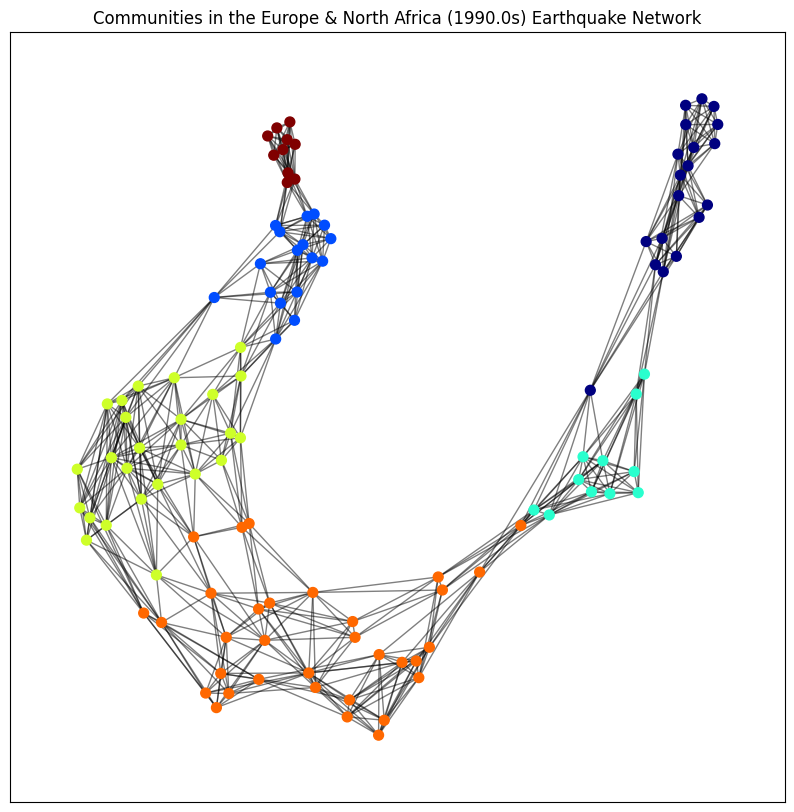

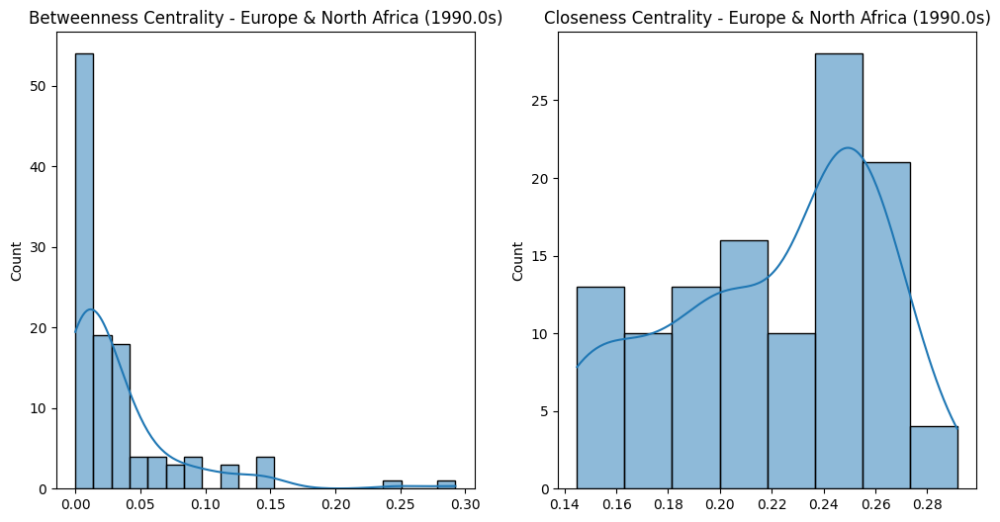

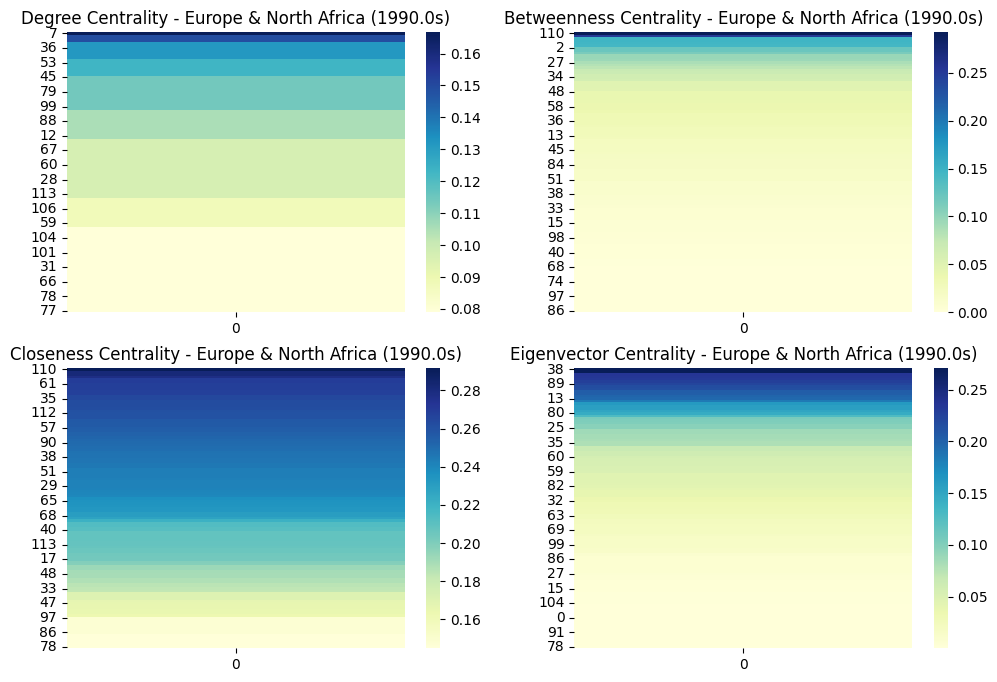

Region: Europe & North Africa, Decade: 2000.0, Modularity: 0.6473734301868481
Top Degree Centrality for Europe & North Africa, Decade: 2000.0
[(35, 0.1565217391304348), (39, 0.1391304347826087), (59, 0.1391304347826087), (65, 0.1391304347826087), (68, 0.1391304347826087)]


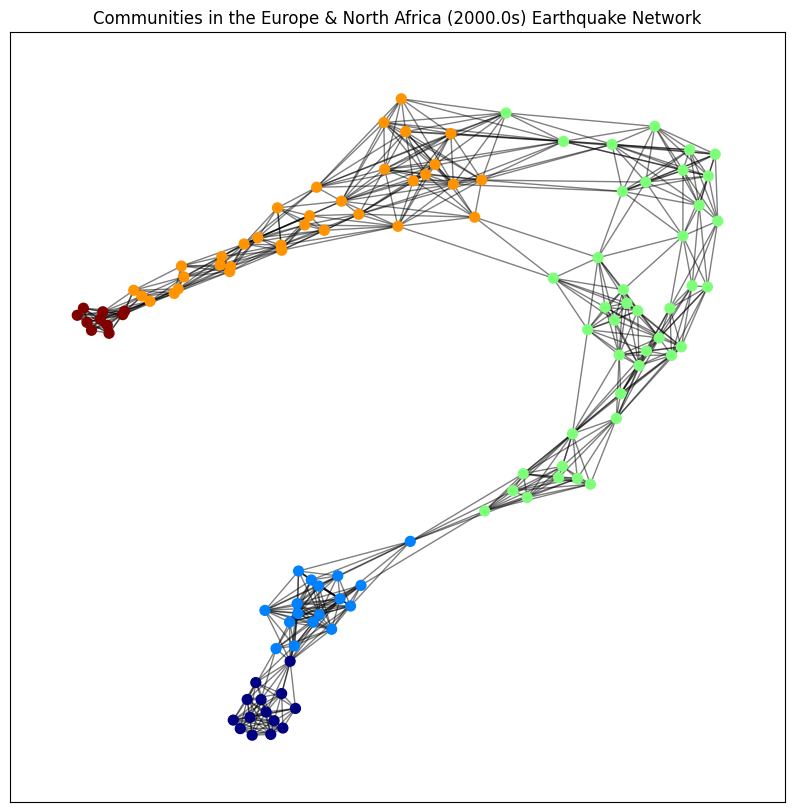

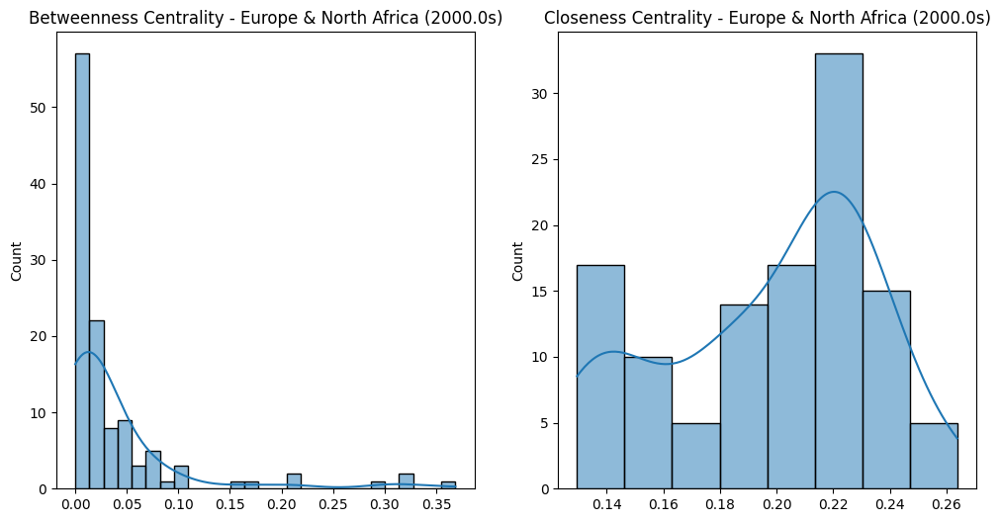

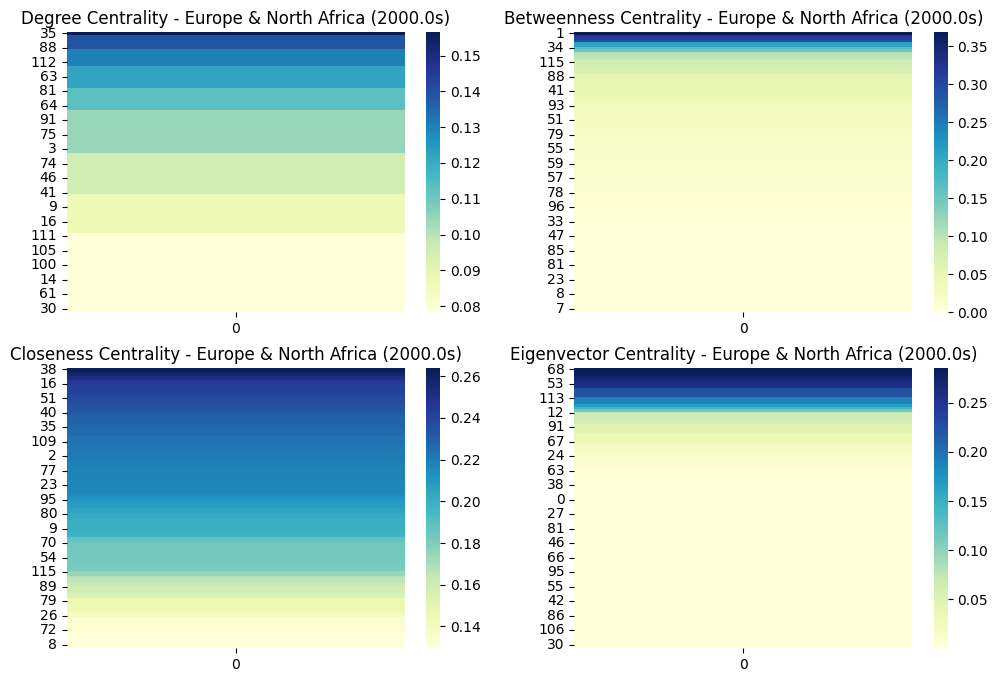

Region: Europe & North Africa, Decade: 2010.0, Modularity: 0.7013460779162355
Top Degree Centrality for Europe & North Africa, Decade: 2010.0
[(8, 0.24050632911392406), (31, 0.22784810126582278), (30, 0.21518987341772153), (59, 0.21518987341772153), (0, 0.20253164556962025)]


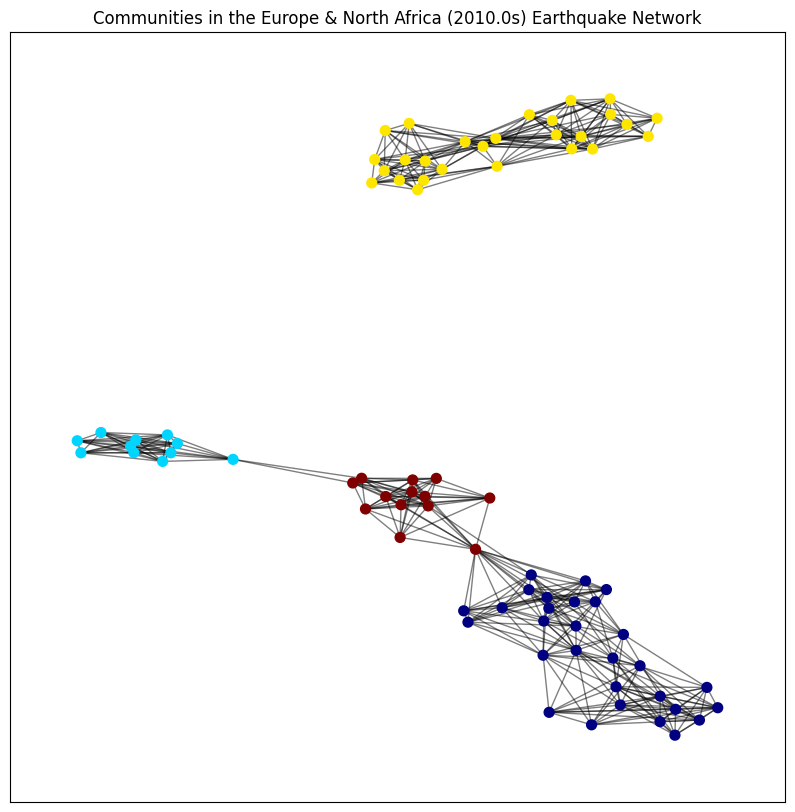

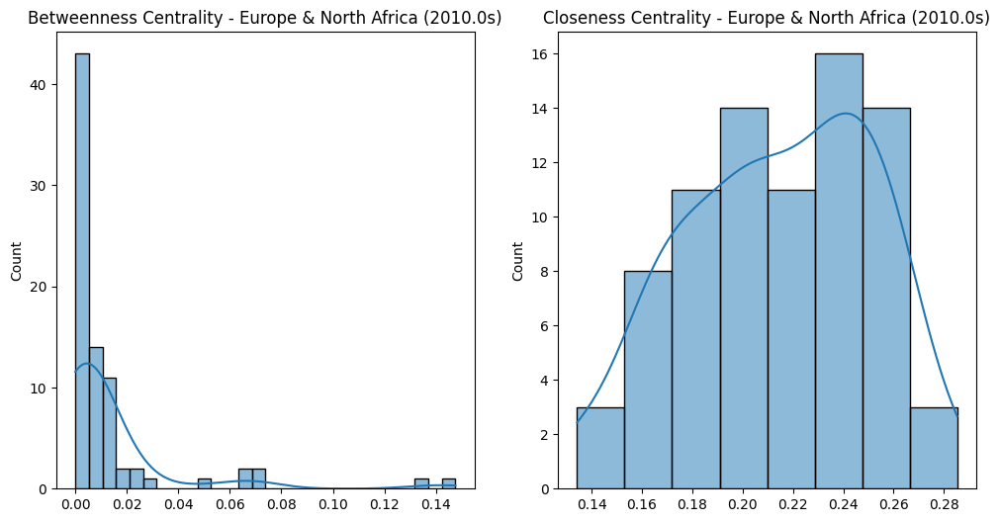

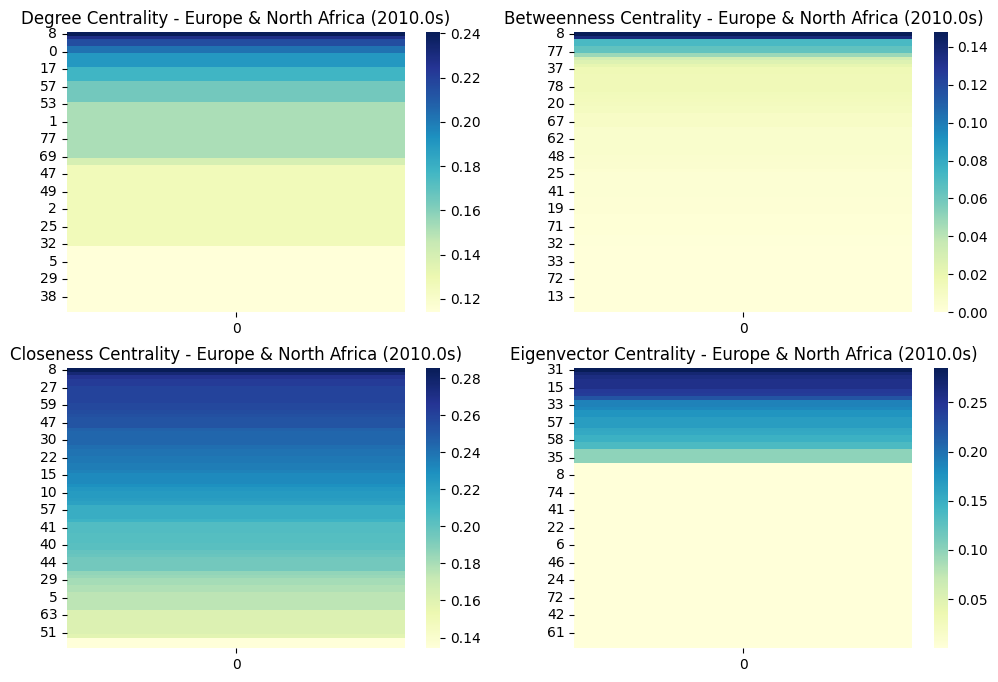

Analyzing region: Middle East & South Asia
Region: Middle East & South Asia, Decade: 1960.0, Modularity: 0.5453410862628838
Top Degree Centrality for Middle East & South Asia, Decade: 1960.0
[(25, 0.27692307692307694), (48, 0.27692307692307694), (51, 0.27692307692307694), (60, 0.26153846153846155), (5, 0.24615384615384617)]


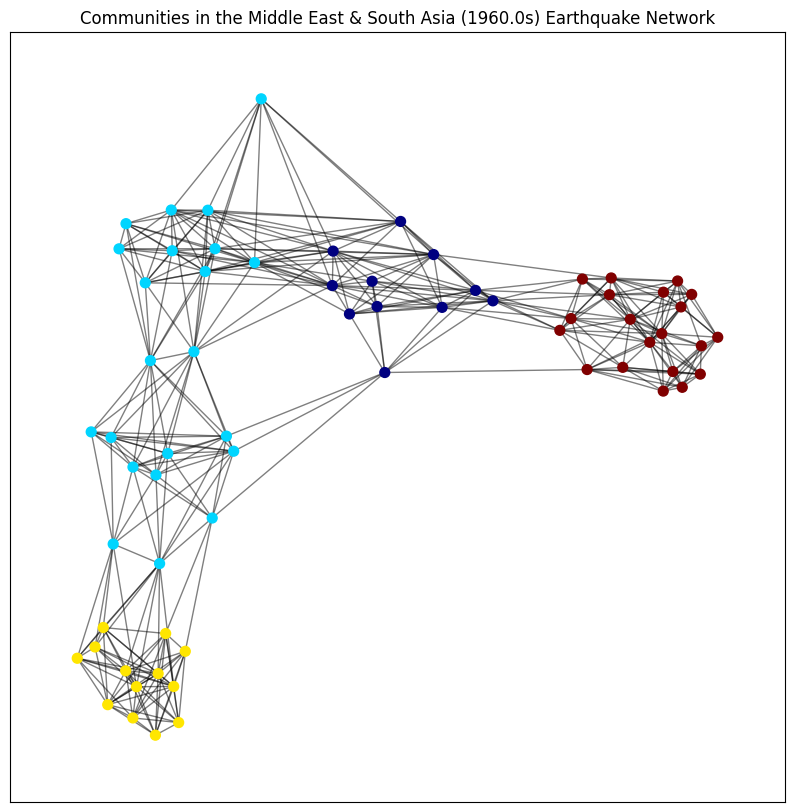

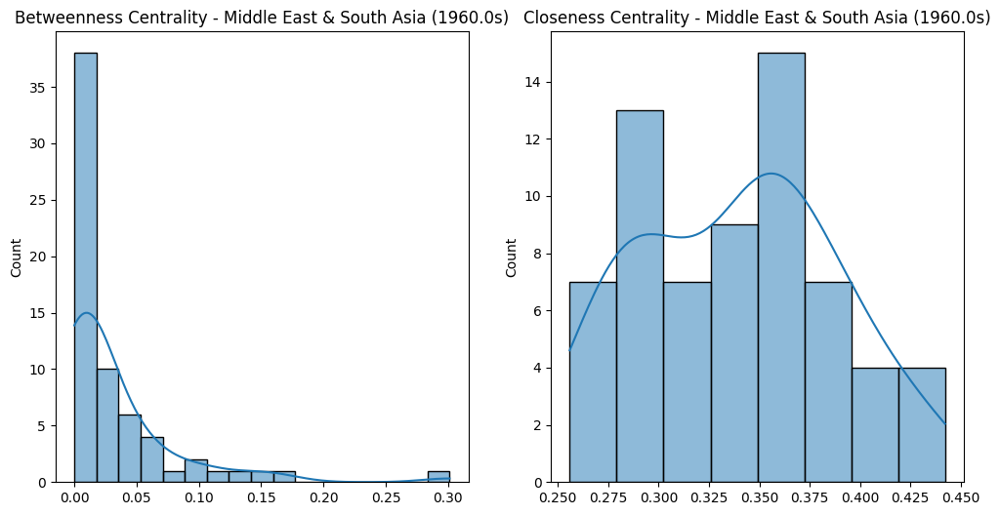

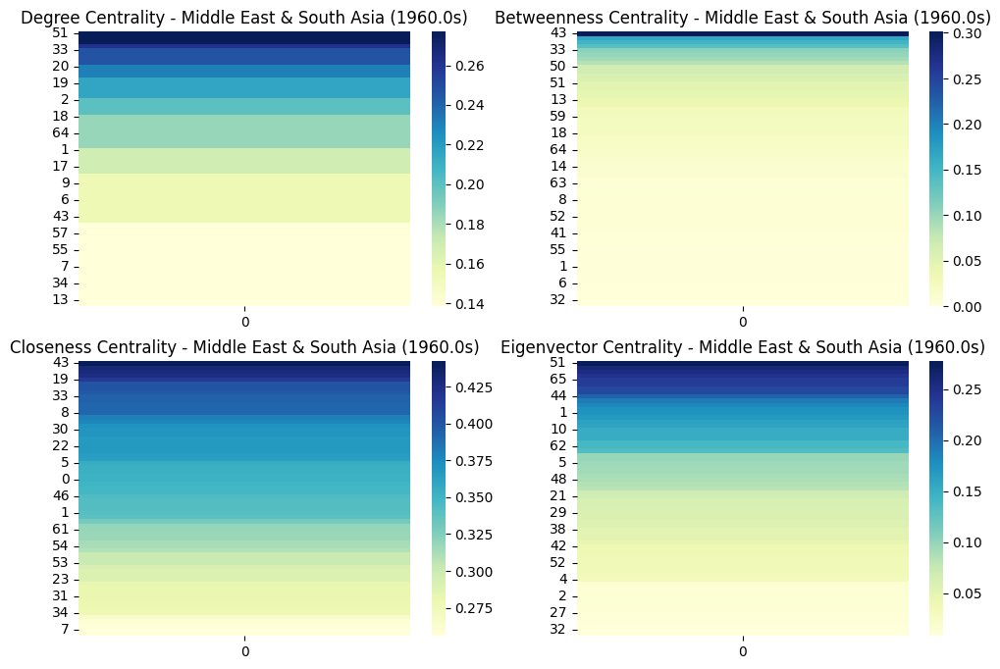

Region: Middle East & South Asia, Decade: 1970.0, Modularity: 0.7244843540705794
Top Degree Centrality for Middle East & South Asia, Decade: 1970.0
[(31, 0.11834319526627218), (22, 0.11242603550295857), (121, 0.10650887573964497), (1, 0.10059171597633136), (11, 0.10059171597633136)]


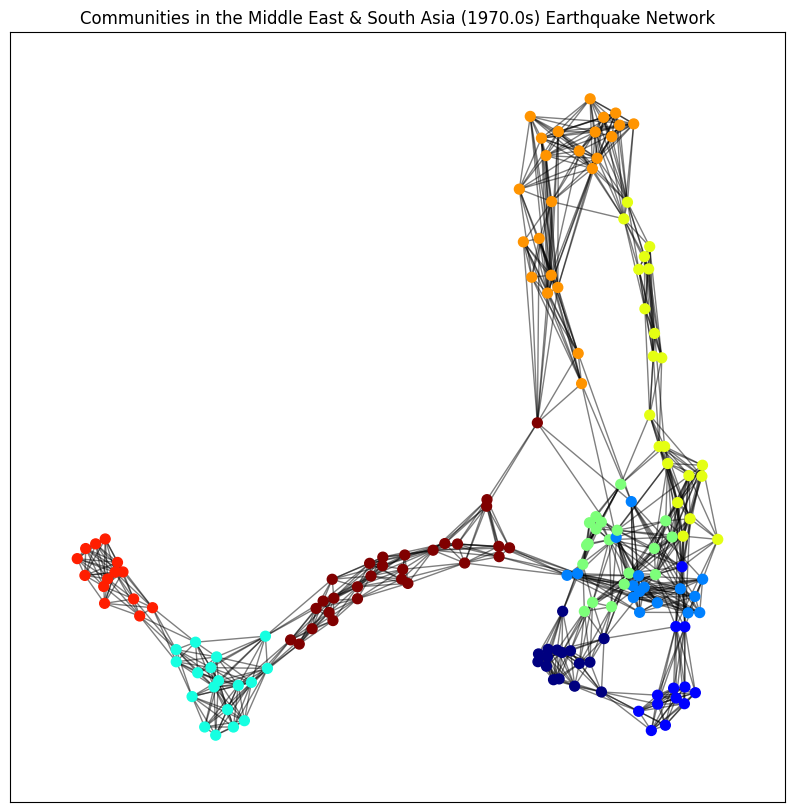

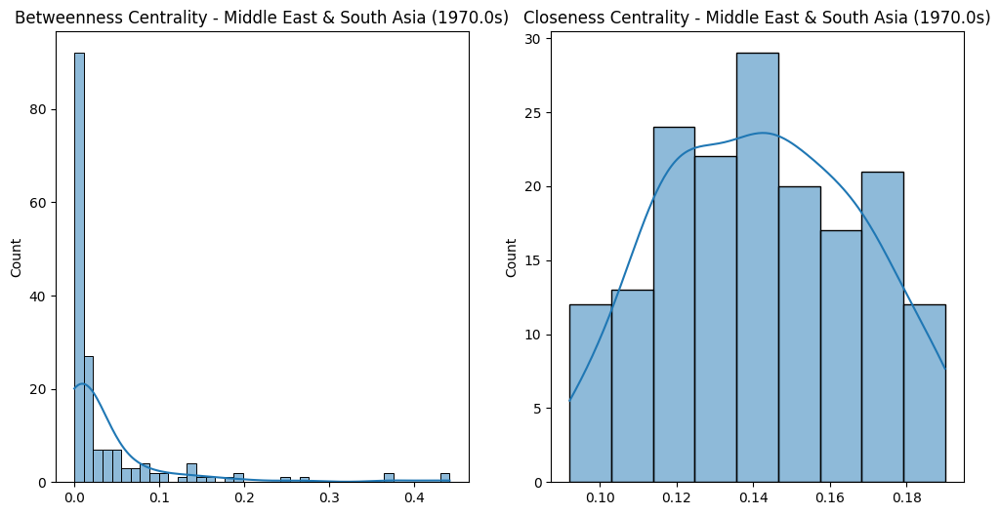

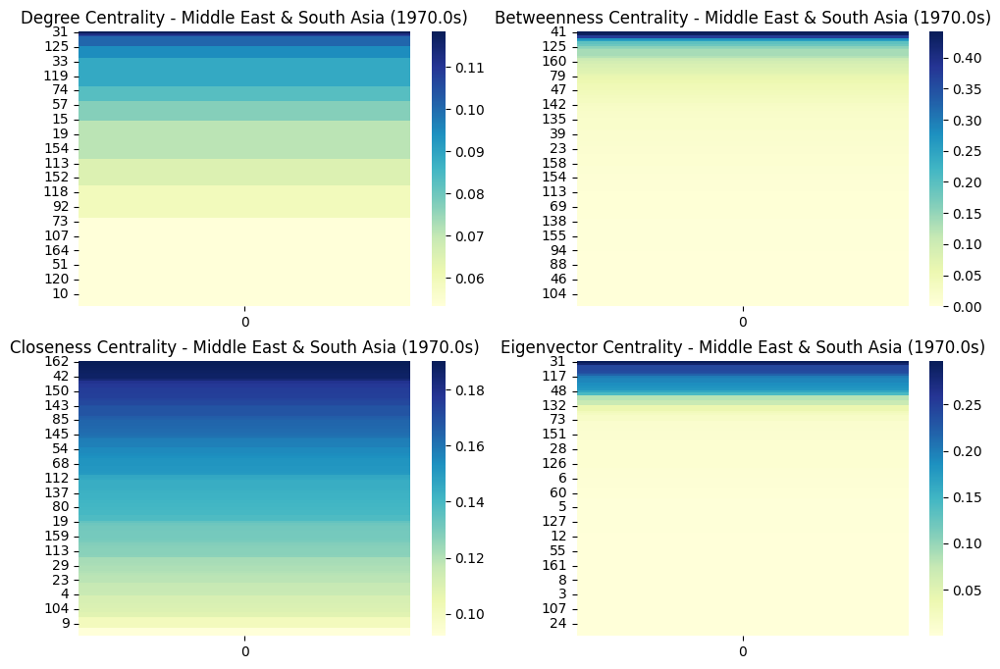

Region: Middle East & South Asia, Decade: 1980.0, Modularity: 0.7487854114984962
Top Degree Centrality for Middle East & South Asia, Decade: 1980.0
[(74, 0.09523809523809523), (49, 0.08994708994708994), (66, 0.08994708994708994), (88, 0.08994708994708994), (104, 0.08994708994708994)]


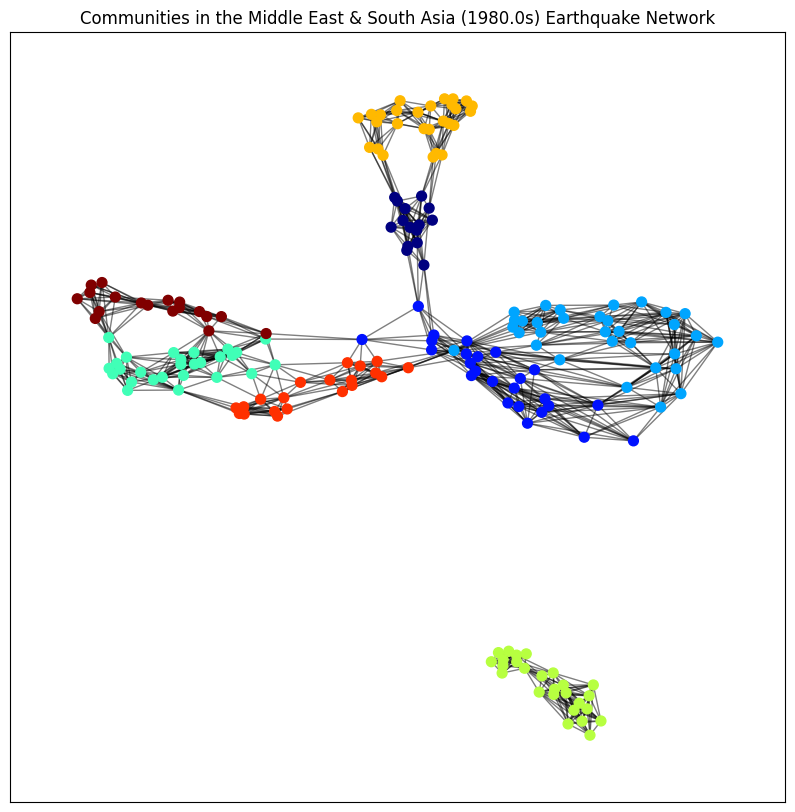

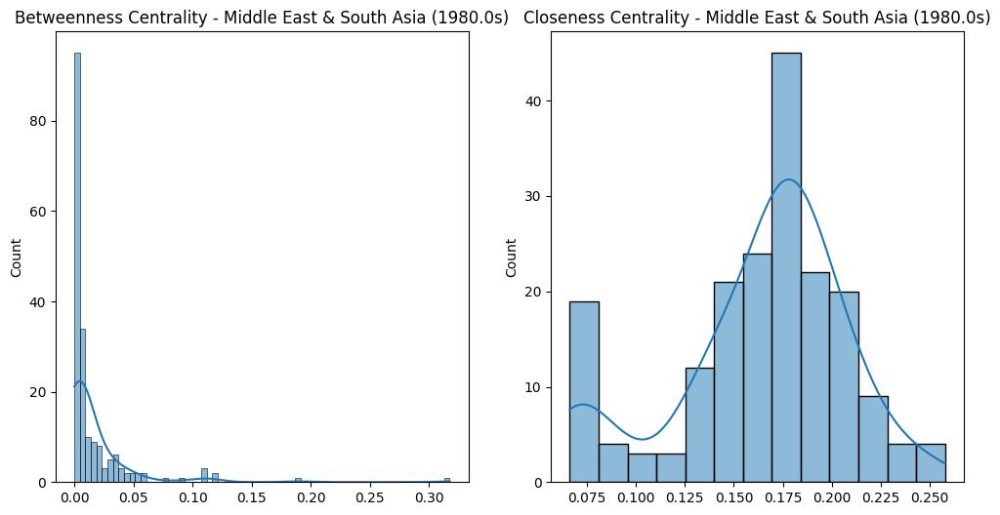

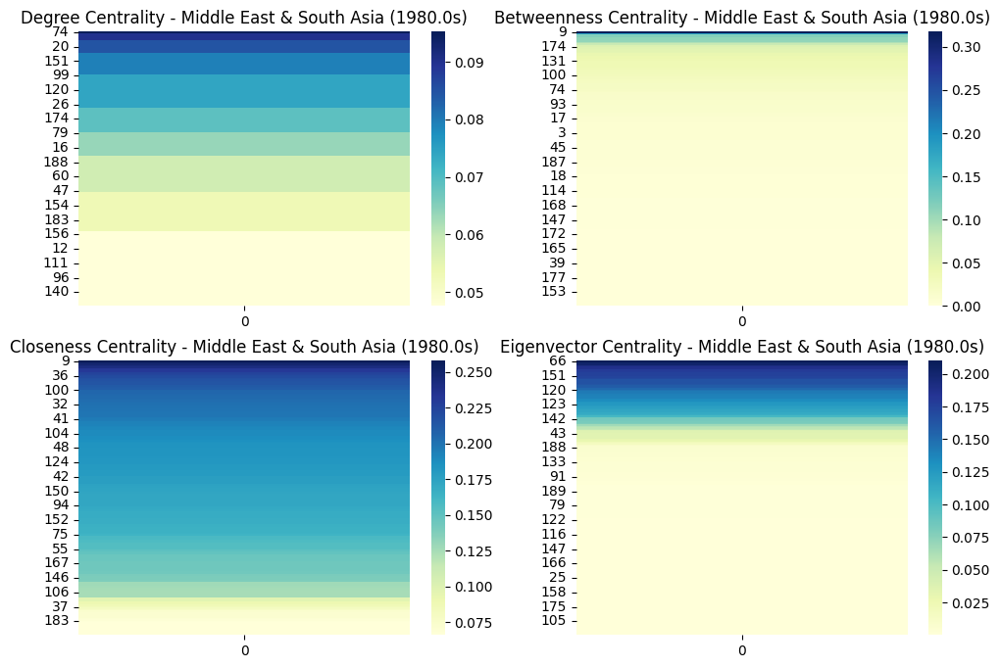

Region: Middle East & South Asia, Decade: 1990.0, Modularity: 0.7849754801337835
Top Degree Centrality for Middle East & South Asia, Decade: 1990.0
[(32, 0.08928571428571427), (67, 0.08482142857142856), (217, 0.08482142857142856), (86, 0.08035714285714285), (6, 0.07589285714285714)]


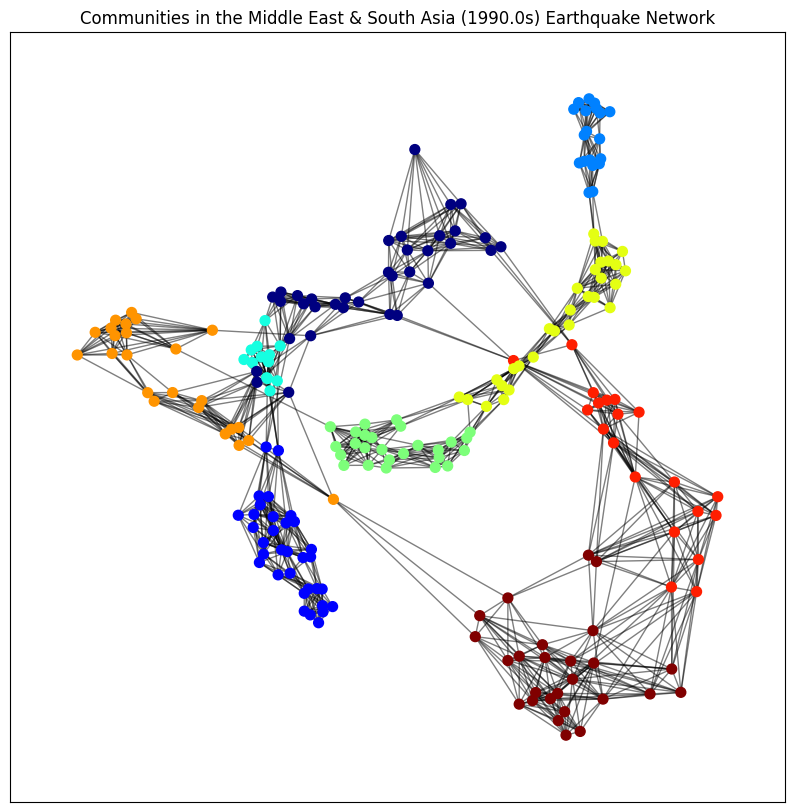

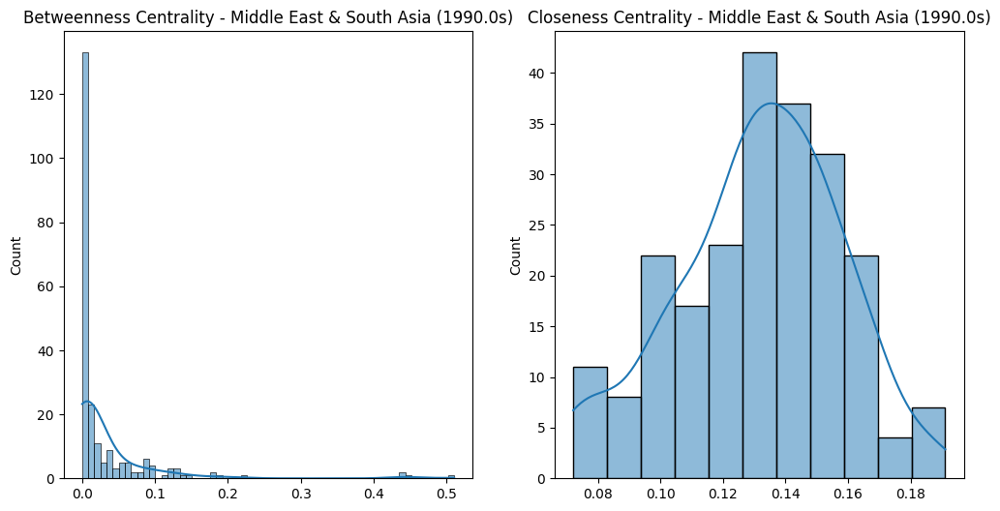

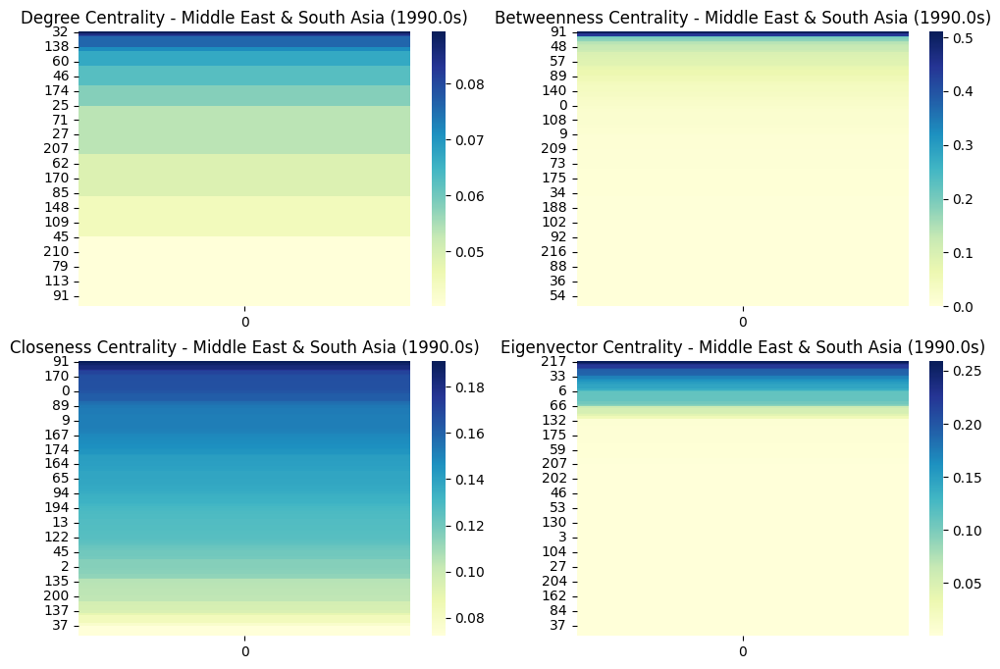

Region: Middle East & South Asia, Decade: 2000.0, Modularity: 0.8001378577939076
Top Degree Centrality for Middle East & South Asia, Decade: 2000.0
[(92, 0.07196969696969698), (77, 0.06818181818181818), (1, 0.06439393939393939), (10, 0.06439393939393939), (55, 0.06439393939393939)]


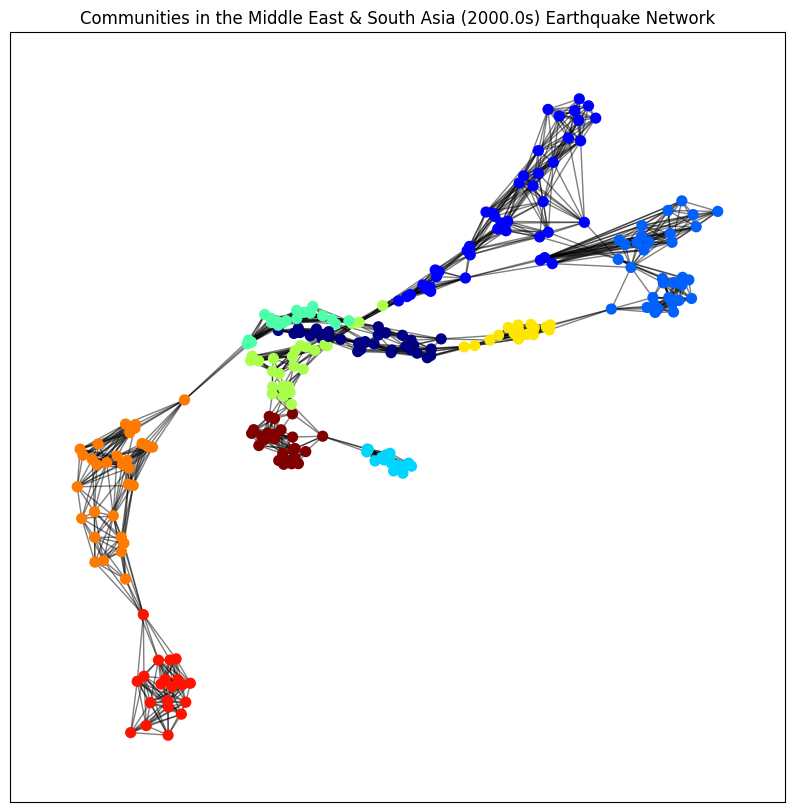

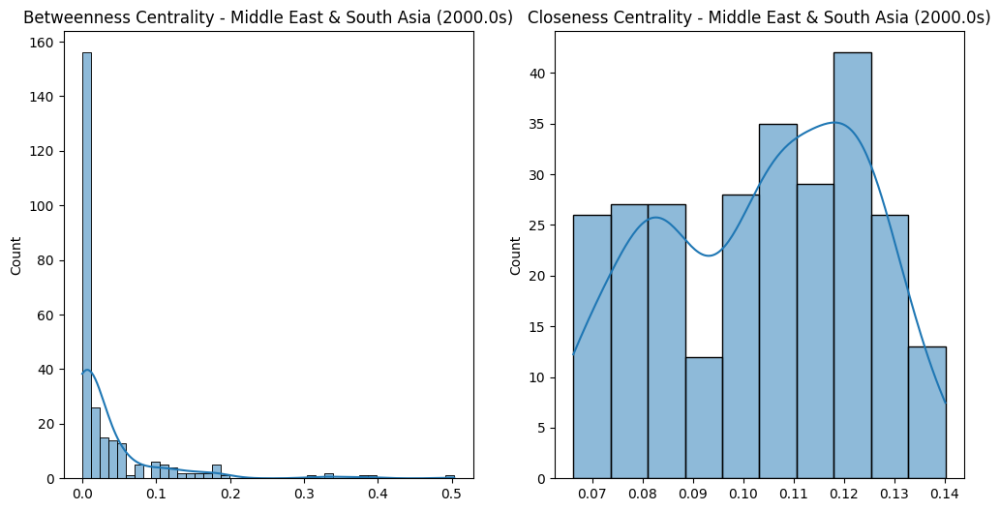

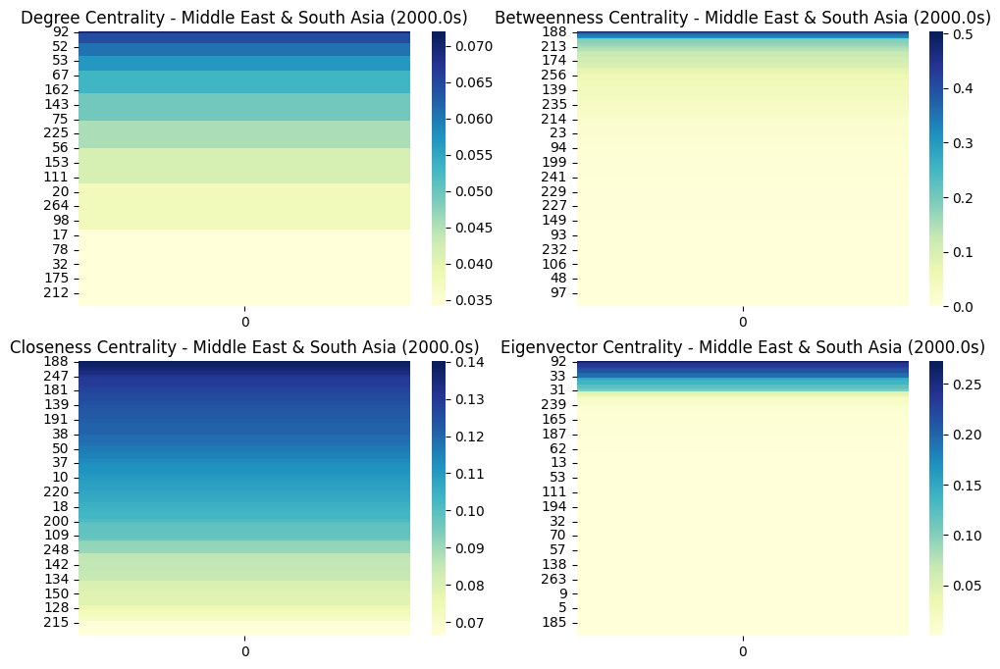

Region: Middle East & South Asia, Decade: 2010.0, Modularity: 0.7408582116879086
Top Degree Centrality for Middle East & South Asia, Decade: 2010.0
[(70, 0.14093959731543623), (63, 0.1342281879194631), (29, 0.12751677852348994), (56, 0.12751677852348994), (16, 0.12080536912751677)]


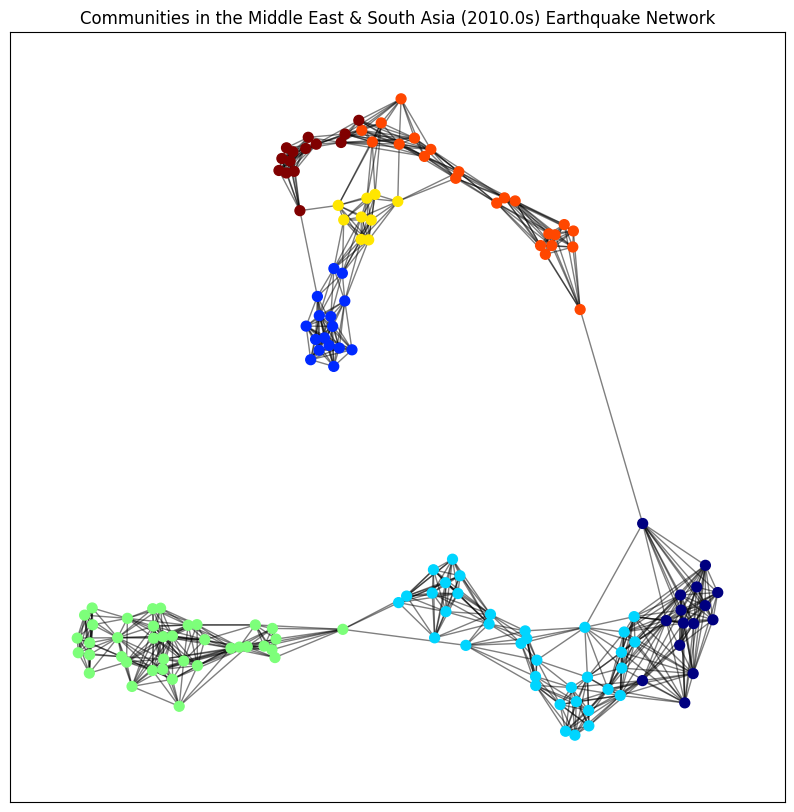

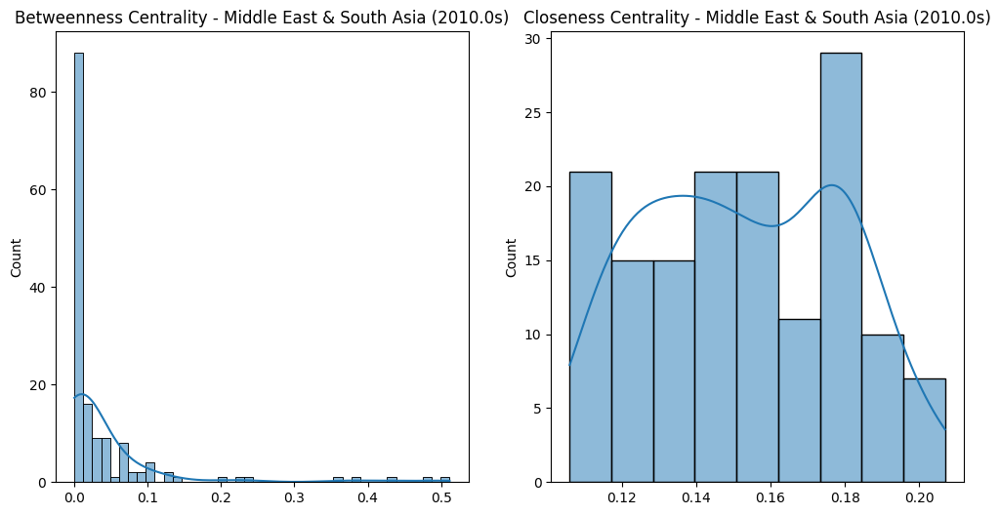

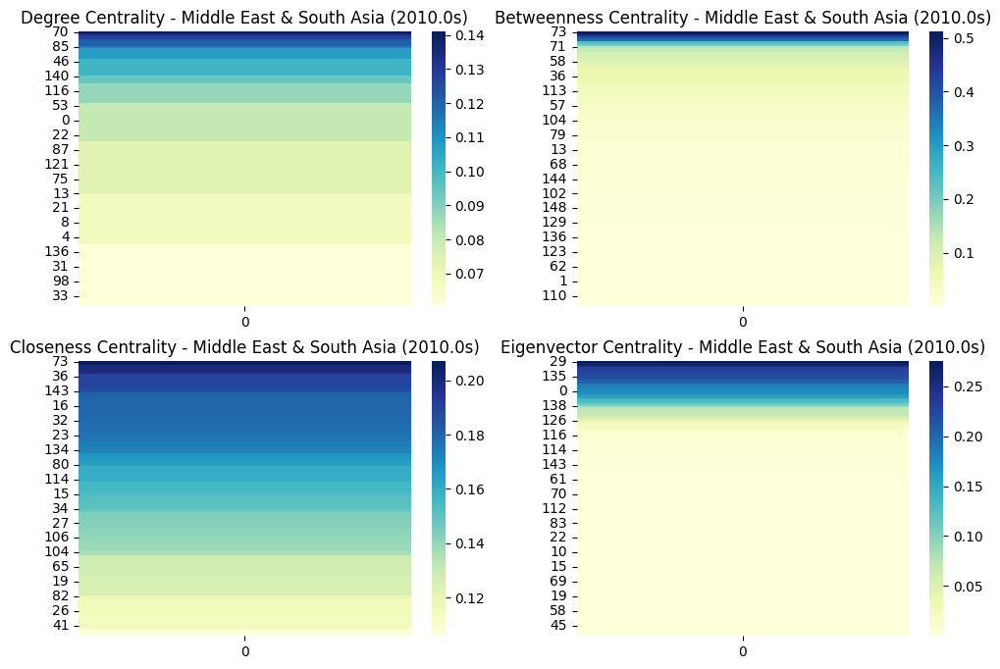

Analyzing region: Southern Africa & Oceania
Region: Southern Africa & Oceania, Decade: 1960.0, Modularity: 0.7585396438456918
Top Degree Centrality for Southern Africa & Oceania, Decade: 1960.0
[(69, 0.0547550432276657), (202, 0.04899135446685879), (11, 0.04610951008645533), (33, 0.04610951008645533), (42, 0.04610951008645533)]


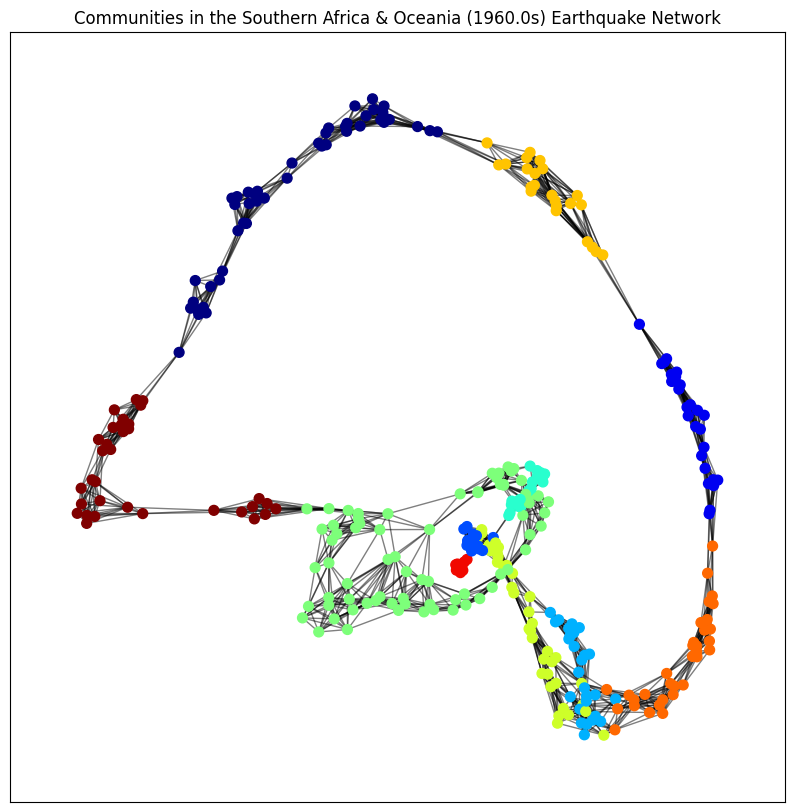

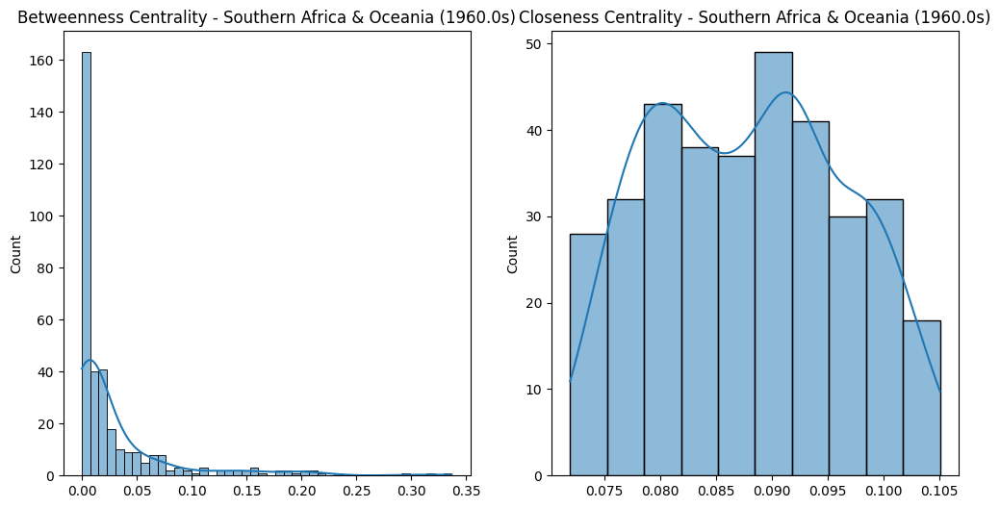

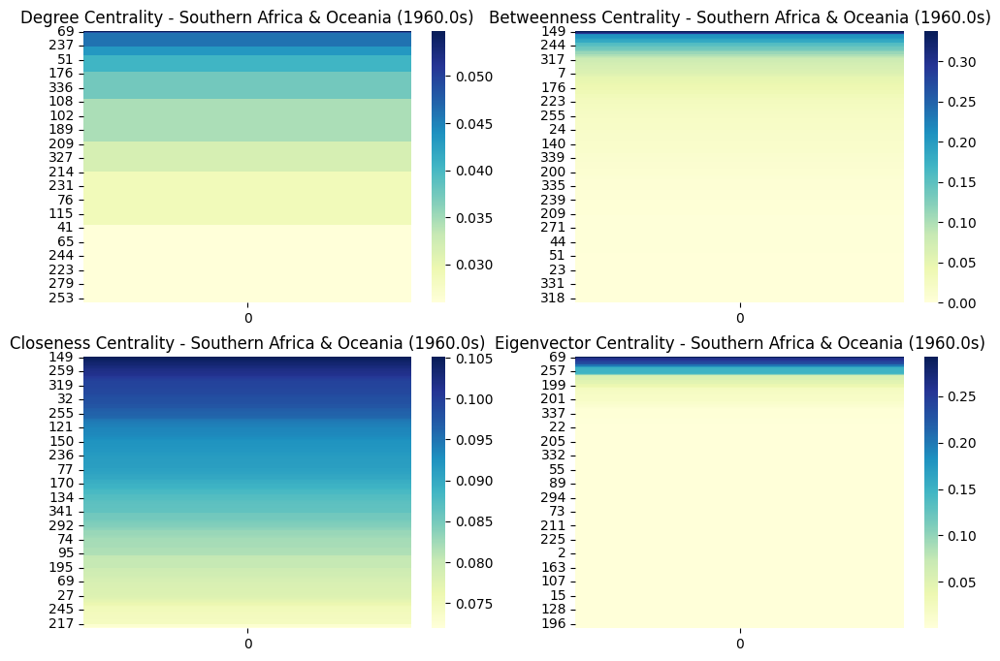

Region: Southern Africa & Oceania, Decade: 1970.0, Modularity: 0.857160839242184
Top Degree Centrality for Southern Africa & Oceania, Decade: 1970.0
[(960, 0.01708706265256306), (644, 0.015459723352318959), (839, 0.015459723352318959), (966, 0.015459723352318959), (102, 0.014646053702196907)]


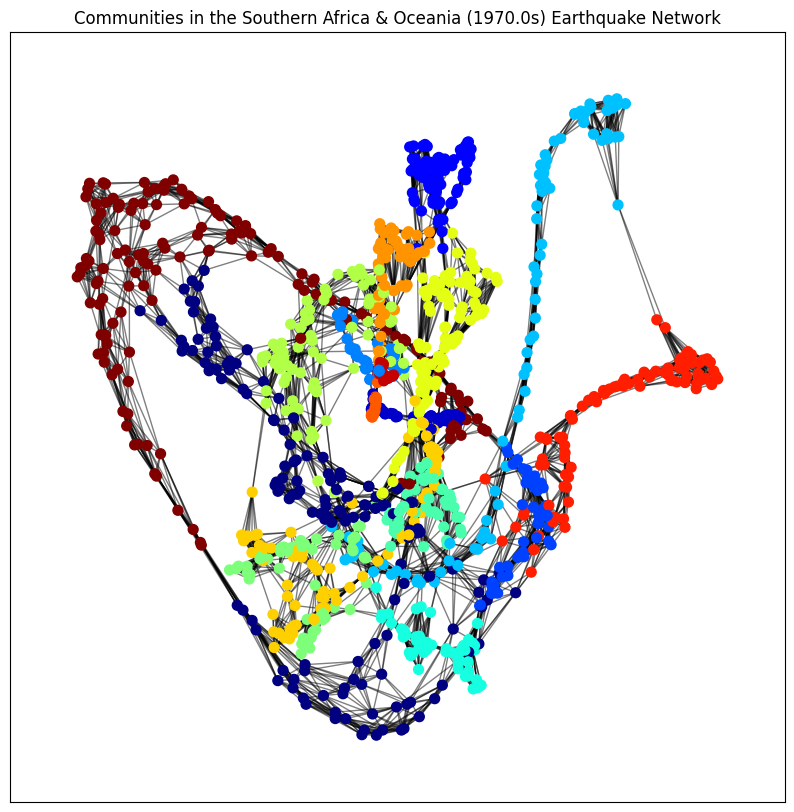

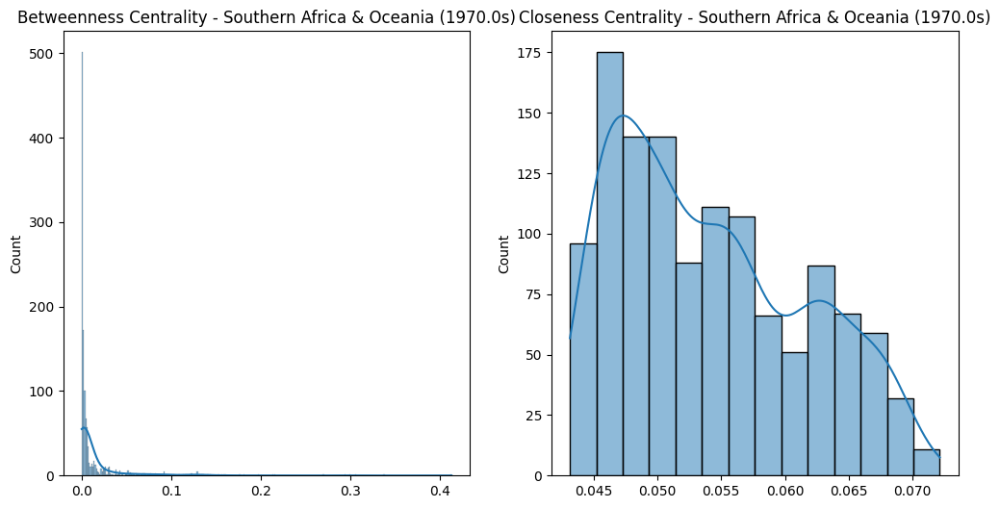

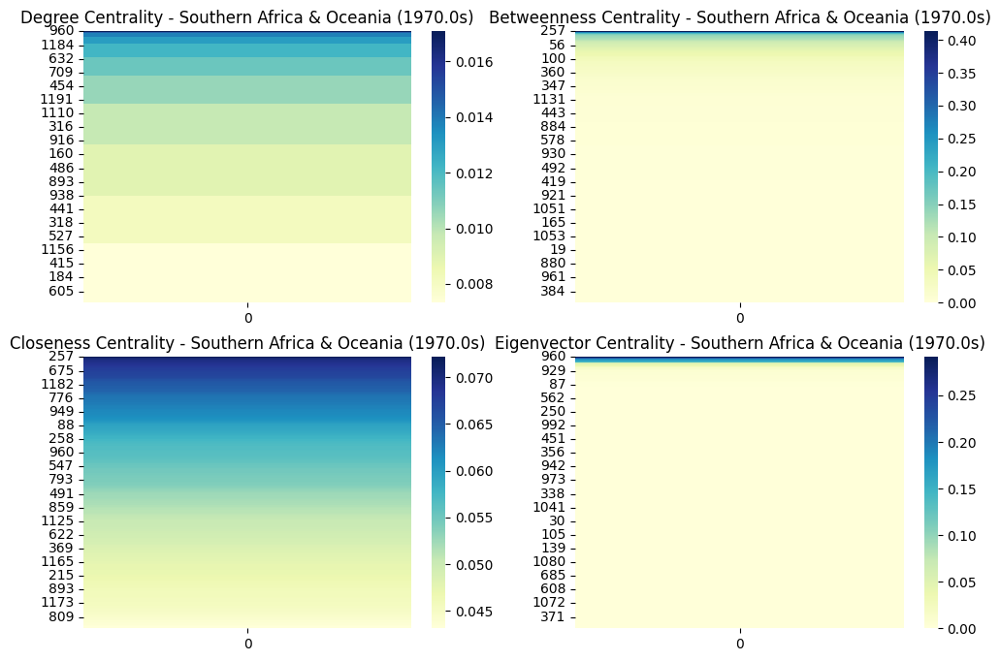

Region: Southern Africa & Oceania, Decade: 1980.0, Modularity: 0.8994393575292436
Top Degree Centrality for Southern Africa & Oceania, Decade: 1980.0
[(426, 0.015748031496062992), (708, 0.014960629921259842), (1051, 0.014960629921259842), (78, 0.014173228346456693), (501, 0.014173228346456693)]


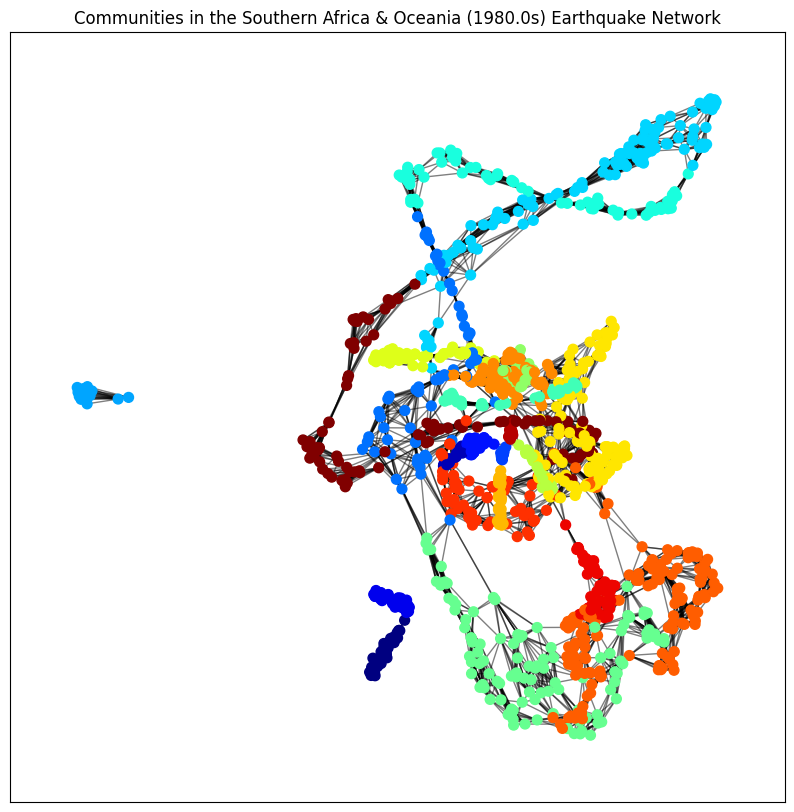

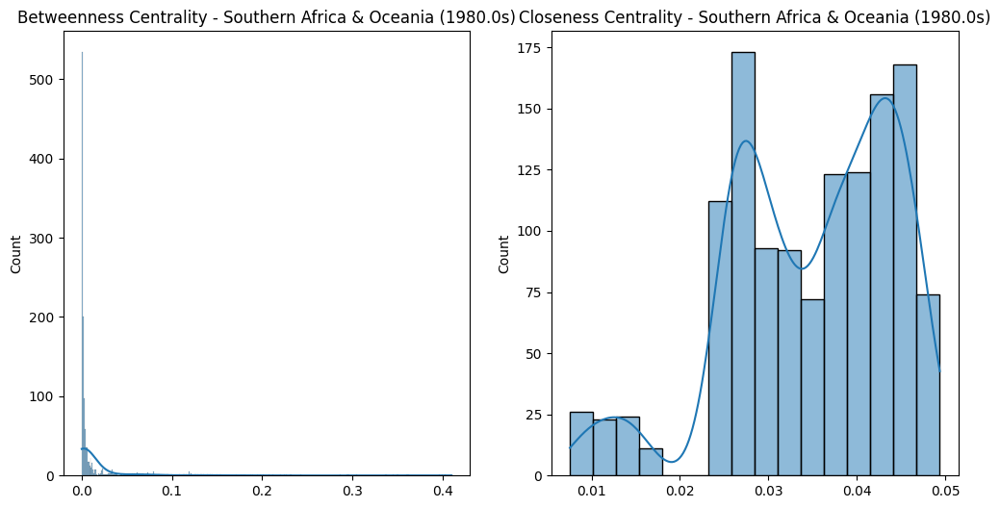

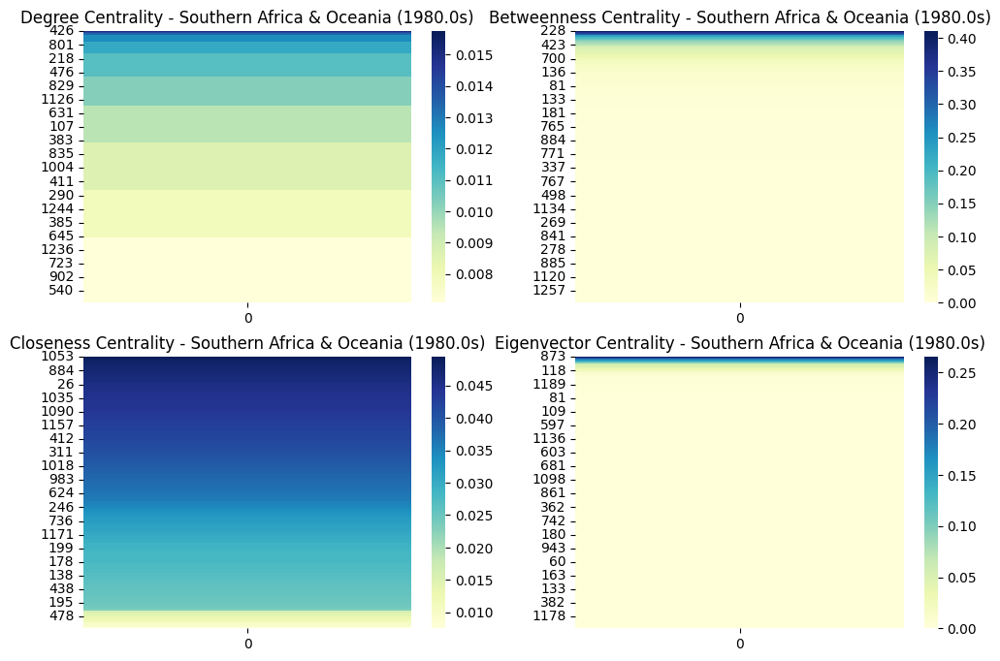

Region: Southern Africa & Oceania, Decade: 1990.0, Modularity: 0.8633530454137616
Top Degree Centrality for Southern Africa & Oceania, Decade: 1990.0
[(599, 0.015384615384615385), (239, 0.013919413919413919), (935, 0.013919413919413919), (960, 0.013919413919413919), (205, 0.013186813186813187)]


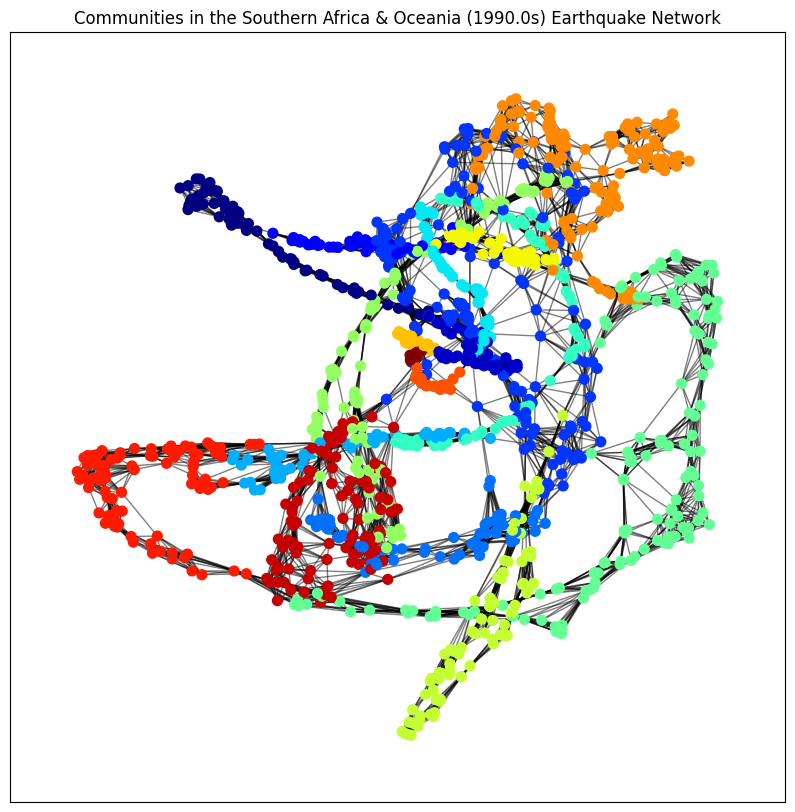

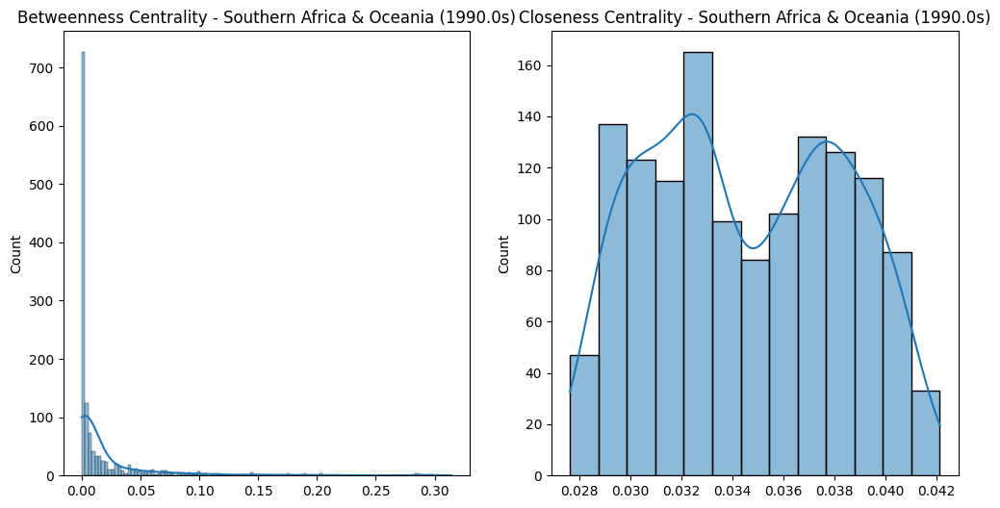

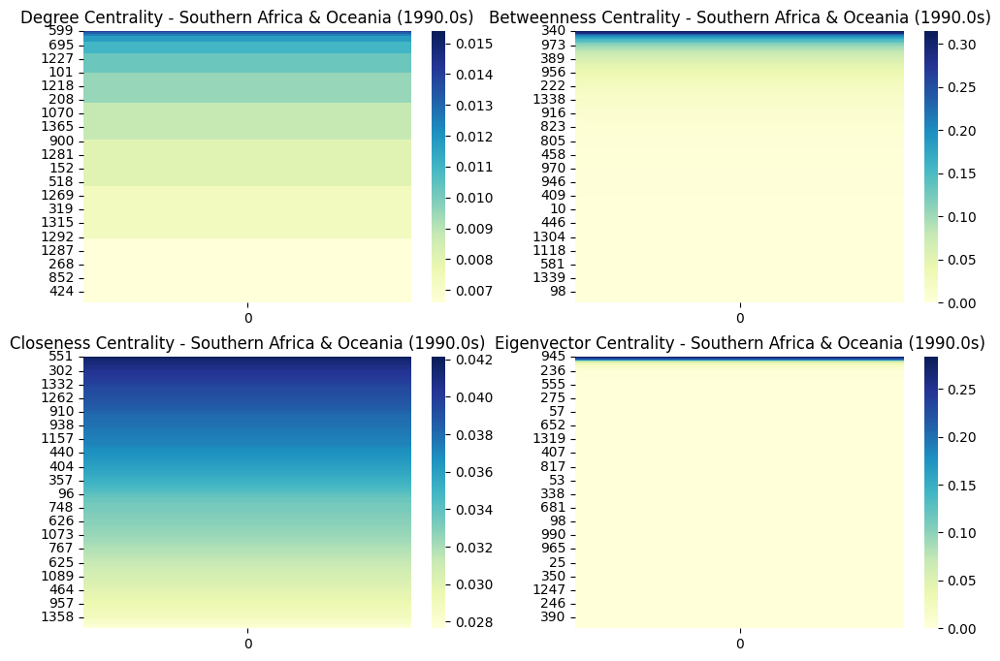

Region: Southern Africa & Oceania, Decade: 2000.0, Modularity: 0.9191481073179559
Top Degree Centrality for Southern Africa & Oceania, Decade: 2000.0
[(1035, 0.012987012987012988), (522, 0.012368583797155226), (991, 0.012368583797155226), (28, 0.011750154607297465), (840, 0.011750154607297465)]


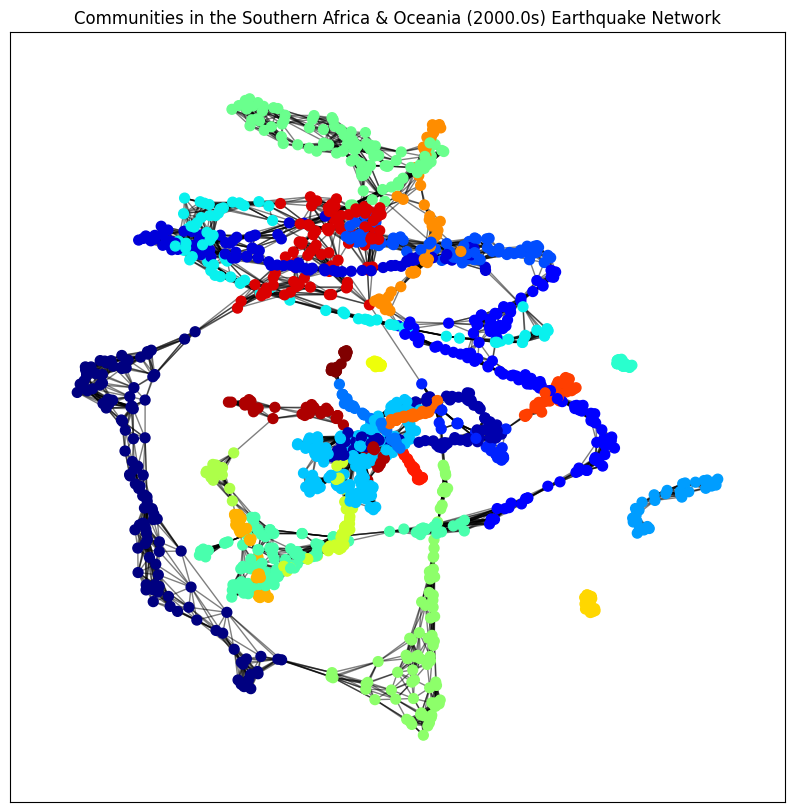

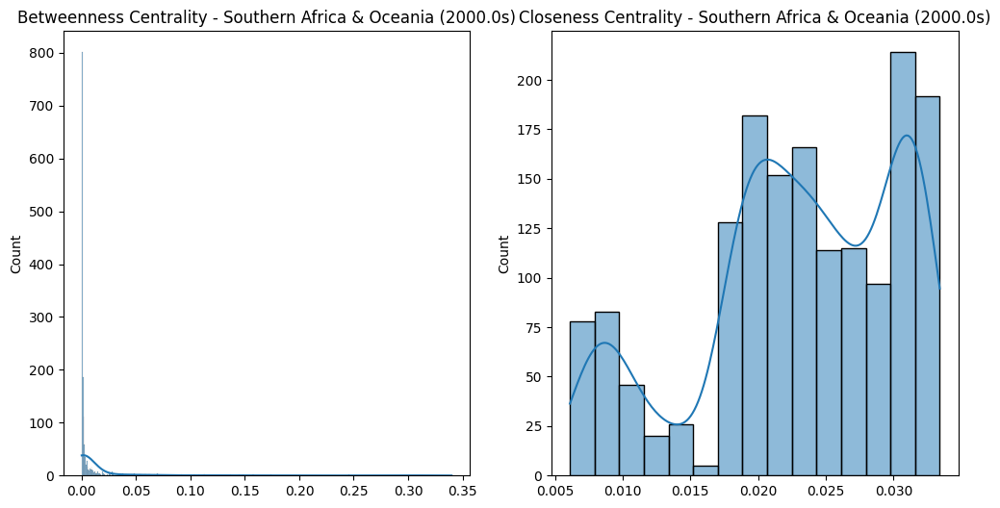

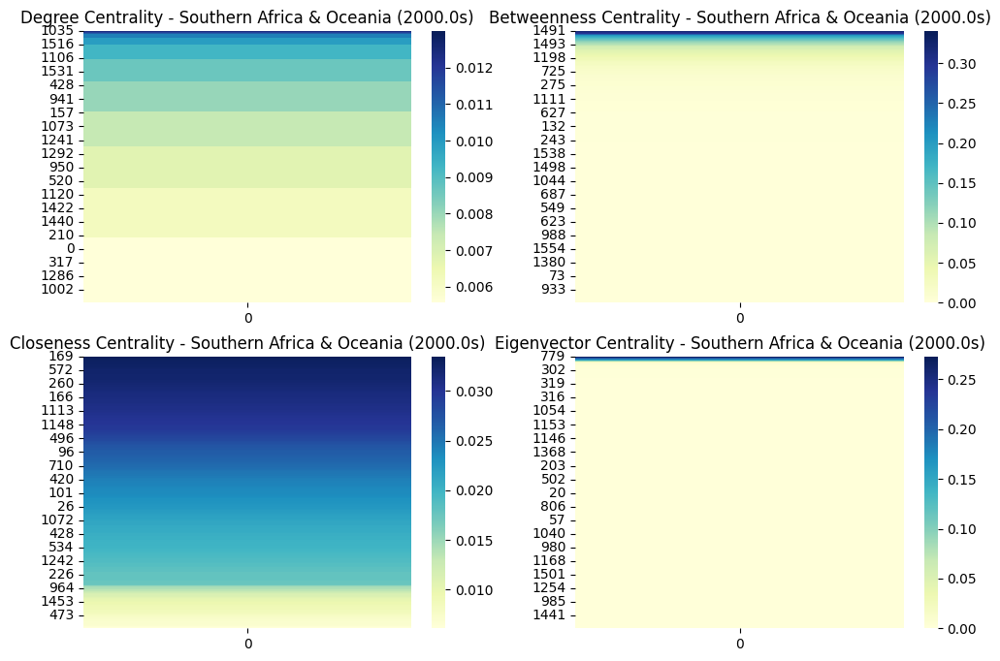

Region: Southern Africa & Oceania, Decade: 2010.0, Modularity: 0.8616190020653941
Top Degree Centrality for Southern Africa & Oceania, Decade: 2010.0
[(895, 0.020618556701030927), (384, 0.01958762886597938), (894, 0.01958762886597938), (6, 0.018556701030927835), (50, 0.018556701030927835)]


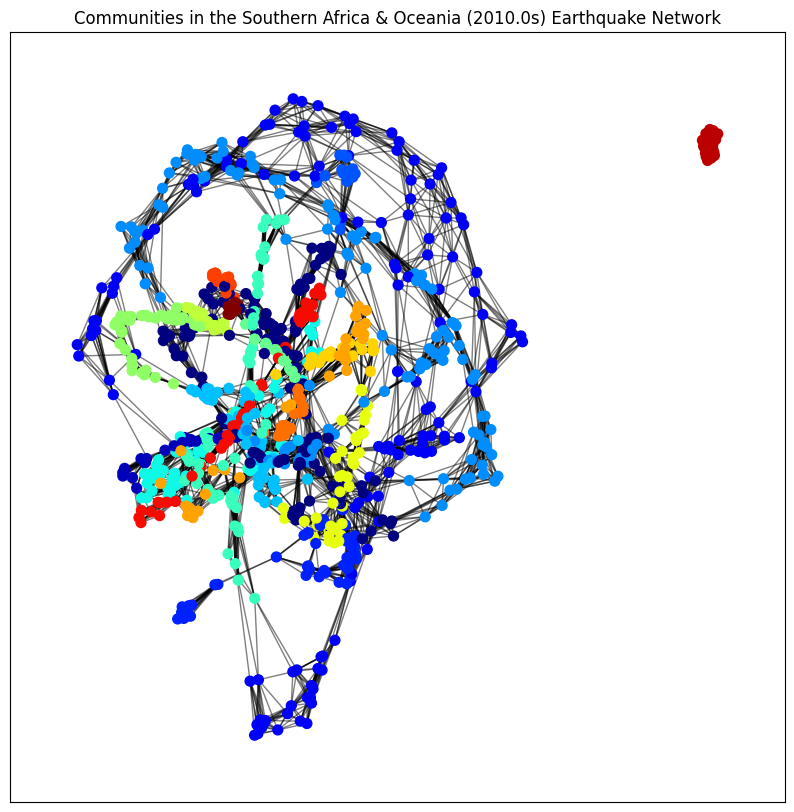

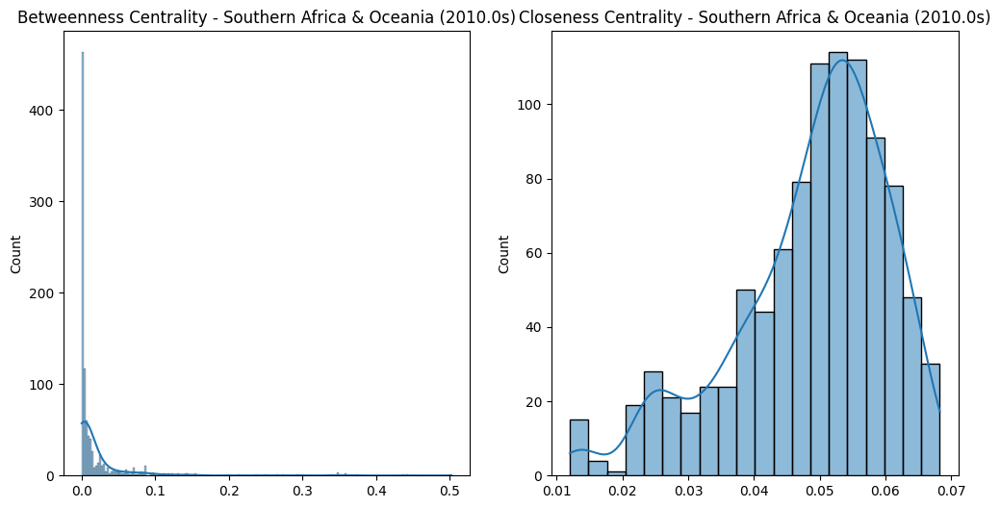

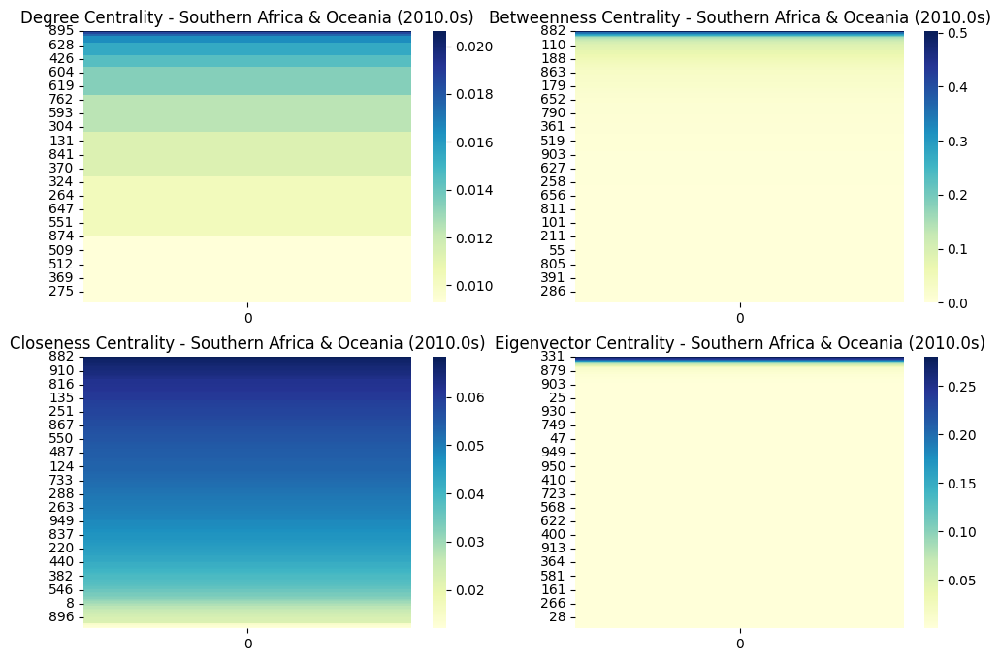

In [36]:
# פונקציה ליצירת גרף מרכזיות עבור אזור מסוים
def plot_centralities(centrality_measures, region_name, decade):
    plt.figure(figsize=(12, 6))

    # גרף מרכזיות בתווך
    plt.subplot(1, 2, 1)
    plt.title(f'Betweenness Centrality - {region_name} ({decade}s)')
    sns.histplot(list(centrality_measures["Betweenness Centrality"].values()), kde=True)

    # גרף מרכזיות קרבה
    plt.subplot(1, 2, 2)
    plt.title(f'Closeness Centrality - {region_name} ({decade}s)')
    sns.histplot(list(centrality_measures["Closeness Centrality"].values()), kde=True)

    plt.show()

# פונקציה ליצירת טבלאות חום עבור מדדי מרכזיות
def plot_heatmaps(centrality_measures, region_name, decade):
    plt.figure(figsize=(12, 8))

    # טבלת חום עבור Degree Centrality
    plt.subplot(2, 2, 1)
    sns.heatmap(pd.DataFrame.from_dict(centrality_measures["Degree Centrality"], orient='index').sort_values(by=0, ascending=False), cmap="YlGnBu", annot=False)
    plt.title(f'Degree Centrality - {region_name} ({decade}s)')

    # טבלת חום עבור Betweenness Centrality
    plt.subplot(2, 2, 2)
    sns.heatmap(pd.DataFrame.from_dict(centrality_measures["Betweenness Centrality"], orient='index').sort_values(by=0, ascending=False), cmap="YlGnBu", annot=False)
    plt.title(f'Betweenness Centrality - {region_name} ({decade}s)')

    # טבלת חום עבור Closeness Centrality
    plt.subplot(2, 2, 3)
    sns.heatmap(pd.DataFrame.from_dict(centrality_measures["Closeness Centrality"], orient='index').sort_values(by=0, ascending=False), cmap="YlGnBu", annot=False)
    plt.title(f'Closeness Centrality - {region_name} ({decade}s)')

    # טבלת חום עבור Eigenvector Centrality
    plt.subplot(2, 2, 4)
    sns.heatmap(pd.DataFrame.from_dict(centrality_measures["Eigenvector Centrality"], orient='index').sort_values(by=0, ascending=False), cmap="YlGnBu", annot=False)
    plt.title(f'Eigenvector Centrality - {region_name} ({decade}s)')

    plt.show()

# פונקציה לניתוח נתוני רעידות האדמה לפי עשורים בכל אזור גיאוגרפי
def analyze_region_by_decades(region_data, region_name):
    print(f"Analyzing region: {region_name}")
    decades = sorted(region_data['Decade'].unique())
    for decade in decades:
        data_decade = region_data[region_data['Decade'] == decade]
        build_and_analyze_network(data_decade, region_name, decade)

# ביצוע ניתוח האזורים עם ניתוח המרכזיות
analyze_region_by_decades(north_america, "North America")
analyze_region_by_decades(south_america, "South America")
analyze_region_by_decades(europe_africa, "Europe & North Africa")
analyze_region_by_decades(middle_east_asia, "Middle East & South Asia")
analyze_region_by_decades(africa_oceania, "Southern Africa & Oceania")


# **הצגת הממצאים בצורה ויזואלית**


>יצרתי טבלת חום להצגת המודולריות לפי עשורים ואזורים, וכן גרף עמודות להצגת המרכזיות מדרגה. הוויזואליזציות הללו עוזרות להמחיש את הממצאים ולהבין את הדינמיקה של הרשתות הסייסמיות לאורך זמן.



**יצירת טבלת חום למודולריות לפי אזור ועשור**

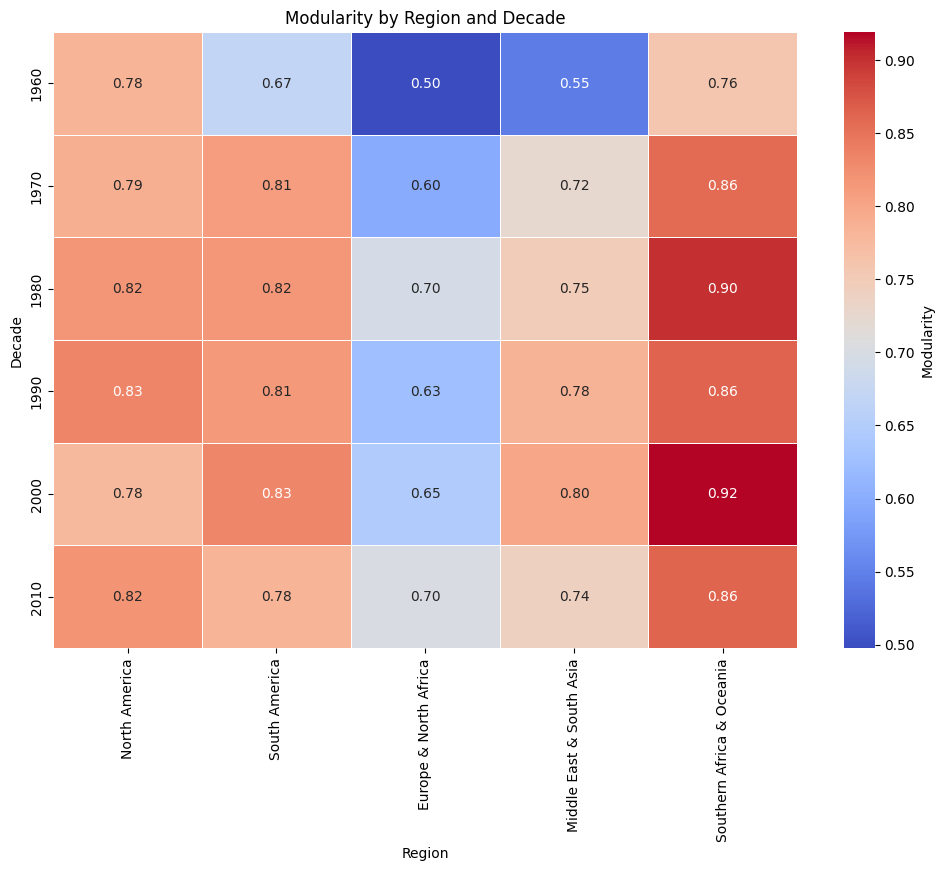

In [37]:
# המרת מילון המודולריות ל-DataFrame
modularity_df = pd.DataFrame(modularity_dict, index=[1960, 1970, 1980, 1990, 2000, 2010])

# הצגת טבלת המודולריות עם מפה צבעונית
plt.figure(figsize=(12, 8))
sns.heatmap(modularity_df, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5, cbar_kws={'label': 'Modularity'})
plt.title('Modularity by Region and Decade')
plt.xlabel('Region')
plt.ylabel('Decade')
plt.show()




> **יצירת גרף עמודות להצגת מרכזיות מדרגה עבור כל אזור ועשור**



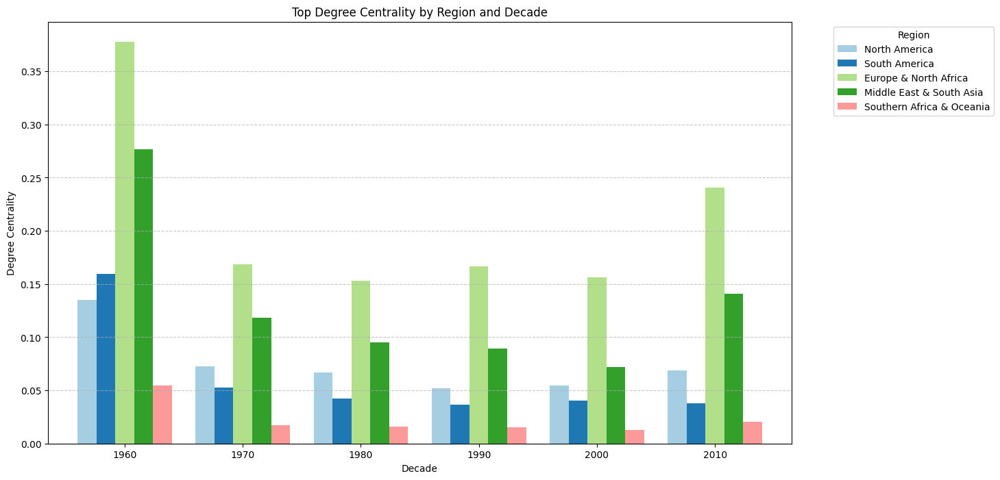

In [38]:
# המרת מילון המרכזיות ל-DataFrame
centrality_df = pd.DataFrame(degree_centrality_dict, index=[1960, 1970, 1980, 1990, 2000, 2010])

# הצגת גרף עמודות למרכזיות מדרגה עם צבעים מותאמים
centrality_df.plot(kind='bar', figsize=(14, 8), width=0.8, color=sns.color_palette("Paired"))
plt.title('Top Degree Centrality by Region and Decade')
plt.ylabel('Degree Centrality')
plt.xlabel('Decade')
plt.xticks(rotation=0)
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# **סיכום והצגת הממצאים**


In [39]:
# המרת מילון המודולריות ל-DataFrame והצגתו כטבלה
modularity_df = pd.DataFrame(modularity_dict, index=[1960, 1970, 1980, 1990, 2000, 2010])
print("Modularity by Region and Decade:")
display(modularity_df)

# המרת מילון המרכזיות ל-DataFrame והצגתו כטבלה
centrality_df = pd.DataFrame(degree_centrality_dict, index=[1960, 1970, 1980, 1990, 2000, 2010])
print("\nTop Degree Centrality by Region and Decade:")
display(centrality_df)

Modularity by Region and Decade:


,North America,South America,Europe & North Africa,Middle East & South Asia,Southern Africa & Oceania
1960,0.782702,0.669024,0.497668,0.545341,0.758540
1970,0.790282,0.809110,0.596544,0.724484,0.857161
1980,0.818575,0.816468,0.695076,0.748785,0.899439
1990,0.833662,0.813482,0.625858,0.784975,0.863353
2000,0.775951,0.832769,0.647373,0.800138,0.919148
2010,0.820175,0.783608,0.701346,0.740858,0.861619



Top Degree Centrality by Region and Decade:


,North America,South America,Europe & North Africa,Middle East & South Asia,Southern Africa & Oceania
1960,0.134921,0.159664,0.377778,0.276923,0.054755
1970,0.072289,0.052342,0.168317,0.118343,0.017087
1980,0.067093,0.042453,0.153153,0.095238,0.015748
1990,0.052239,0.036364,0.166667,0.089286,0.015385
2000,0.054755,0.040254,0.156522,0.071970,0.012987
2010,0.068841,0.037578,0.240506,0.140940,0.020619
